In [1]:
# import library
import os
import numpy as np
import pandas as pd
import seaborn as sns
from matplotlib import pyplot as plt
%matplotlib inline

# make sure pandas will show all columns and rows
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)

# Remove waringns
import warnings
warnings.filterwarnings('ignore')

# Functions define

In [2]:
def eleminate_upper_ouliers(data, columns, print_output = True):
    """
        Find outliers upper fence, value > Q3 + 1.5*IQR
        Input: Dataframe
        Output: Dataframe which eleminated outliers
    """
    df_quantile = data[columns].quantile([0.25, 0.75])
    Q1 = df_quantile[0.25]
    Q3 = df_quantile[0.75]
    IQR = Q3 - Q1
    upper_outlier = Q3+1.5*IQR
    
    ret_data = data[data[columns]<upper_outlier]
    
    # print some results
    if print_output:
        outliters = data[data[columns]>upper_outlier]
        print("Upper outliers of dataset:", upper_outlier)
        print("Some rows of outliers\n")
        print("A look of boxplot after remove outliers")
        sns.boxplot(x = ret_data[columns])
        plt.plot()
    return ret_data, outliters

In [3]:
def plot_uni_numb(data, column, figsize=[20,10]):  
        plt.figure(figsize=figsize)
        
        # count number of category
        
        # firgue 1
        plt.subplot(1,3,1)
        sns.histplot(data = data[column])
        plt.title(("Histogram of" + column), fontsize=12)
        # firgue 2
        plt.subplot(1,3,2)
        sns.boxplot(data = data[column])
        plt.title("Box plot " + column, fontsize=12)
        # firgue 3
        plt.subplot(1,3,3)
        sns.boxplot(y = data[column], x= data['default_status'], palette = 'hls')
        plt.title("Box plot " + column, fontsize=12)
        
        
        plt.show()

In [4]:
# def plot_uni_cate(data, column, figsize=[20,5]):  
#         plt.figure(figsize=figsize)
        
#         # firgue 1
#         plt.subplot(1,2,1)
#         df["loan_amnt_group"].value_counts().plot.pie(autopct='%1.2f%%', shadow=True, startangle=90)
#         plt.title(("Histogram of" + column), fontsize=12)
#         # firgue 2
#         plt.subplot(1,2,2)
#         sns.countplot(data[column])
#         plt.title("Box plot " + column, fontsize=12)
        
#         plt.show()

In [5]:
def plot_bi_cate(data, column, figsize=[20,15], check_order = False):  
        plt.figure(figsize=figsize)
        
        if check_order:
            order = sorted(list(data[column].unique()))
        else:
            order = None
        
        plt.subplot(3,1,1)
        data[column].value_counts().plot.pie(autopct='%1.2f%%', shadow=True, startangle=90)
        plt.title(("Histogram of" + column), fontsize=12)
         
        plt.subplot(3,1,2)
        sns.countplot(x=df[column], order = order)
        plt.title(("Distribution of " + column), fontsize=12)
                
        plt.subplot(3,1,3)
        sns.barplot(x = data[column], y= data['default_status'], palette = 'hls', order = order)
        plt.title("Default Rate by " + column, fontsize=12)
        plt.show()

# Data Understanding

In [6]:
df = pd.read_csv("data/loan.csv", low_memory=False)
df.head()

,id,member_id,loan_amnt,funded_amnt,funded_amnt_inv,term,int_rate,installment,grade,sub_grade,emp_title,emp_length,home_ownership,annual_inc,verification_status,issue_d,loan_status,pymnt_plan,url,desc,purpose,title,zip_code,addr_state,dti,delinq_2yrs,earliest_cr_line,inq_last_6mths,mths_since_last_delinq,mths_since_last_record,open_acc,pub_rec,revol_bal,revol_util,total_acc,initial_list_status,out_prncp,out_prncp_inv,total_pymnt,total_pymnt_inv,total_rec_prncp,total_rec_int,total_rec_late_fee,recoveries,collection_recovery_fee,last_pymnt_d,last_pymnt_amnt,next_pymnt_d,last_credit_pull_d,collections_12_mths_ex_med,mths_since_last_major_derog,policy_code,application_type,annual_inc_joint,dti_joint,verification_status_joint,acc_now_delinq,tot_coll_amt,tot_cur_bal,open_acc_6m,open_il_6m,open_il_12m,open_il_24m,mths_since_rcnt_il,total_bal_il,il_util,open_rv_12m,open_rv_24m,max_bal_bc,all_util,total_rev_hi_lim,inq_fi,total_cu_tl,inq_last_12m,acc_open_past_24mths,avg_cur_bal,bc_open_to_buy,bc_util,chargeoff_within_12_mths,delinq_amnt,mo_sin_old_il_acct,mo_sin_old_rev_tl_op,mo_sin_rcnt_rev_tl_op,mo_sin_rcnt_tl,mort_acc,mths_since_recent_bc,mths_since_recent_bc_dlq,mths_since_recent_inq,mths_since_recent_revol_delinq,num_accts_ever_120_pd,num_actv_bc_tl,num_actv_rev_tl,num_bc_sats,num_bc_tl,num_il_tl,num_op_rev_tl,num_rev_accts,num_rev_tl_bal_gt_0,num_sats,num_tl_120dpd_2m,num_tl_30dpd,num_tl_90g_dpd_24m,num_tl_op_past_12m,pct_tl_nvr_dlq,percent_bc_gt_75,pub_rec_bankruptcies,tax_liens,tot_hi_cred_lim,total_bal_ex_mort,total_bc_limit,total_il_high_credit_limit
0,1077501,1296599,5000,5000,4975.0,36 months,10.65%,162.87,B,B2,NaN,10+ years,RENT,24000.0,Verified,Dec-11,Fully Paid,n,https://lendingclub.com/browse/loanDetail.acti...,Borrower added on 12/22/11 > I need to upgra...,credit_card,Computer,860xx,AZ,27.65,0,Jan-85,1,NaN,NaN,3,0,13648,83.70%,9,f,0.00,0.00,5863.155187,5833.84,5000.00,863.16,0.00,0.00,0.00,Jan-15,171.62,NaN,May-16,0.0,NaN,1,INDIVIDUAL,NaN,NaN,NaN,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0,NaN,NaN,NaN,NaN
1,1077430,1314167,2500,2500,2500.0,60 months,15.27%,59.83,C,C4,Ryder,< 1 year,RENT,30000.0,Source Verified,Dec-11,Charged Off,n,https://lendingclub.com/browse/loanDetail.acti...,Borrower added on 12/22/11 > I plan to use t...,car,bike,309xx,GA,1.00,0,Apr-99,5,NaN,NaN,3,0,1687,9.40%,4,f,0.00,0.00,1008.710000,1008.71,456.46,435.17,0.00,117.08,1.11,Apr-13,119.66,NaN,Sep-13,0.0,NaN,1,INDIVIDUAL,NaN,NaN,NaN,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0,NaN,NaN,NaN,NaN
2,1077175,1313524,2400,2400,2400.0,36 months,15.96%,84.33,C,C5,NaN,10+ years,RENT,12252.0,Not Verified,Dec-11,Fully Paid,n,https://lendingclub.com/browse/loanDetail.acti...,NaN,small_business,real estate business,606xx,IL,8.72,0,Nov-01,2,NaN,NaN,2,0,2956,98.50%,10,f,0.00,0.00,3005.666844,3005.67,2400.00,605.67,0.00,0.00,0.00,Jun-14,649.91,NaN,May-16,0.0,NaN,1,INDIVIDUAL,NaN,NaN,NaN,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0,NaN,NaN,NaN,NaN
3,1076863,1277178,10000,10000,10000.0,36 months,13.49%,339.31,C,C1,AIR RESOURCES BOARD,10+ years,RENT,49200.0,Source Verified,Dec-11,Fully Paid,n,https://lendingclub.com/browse/loanDetail.acti...,Borrower added on 12/21/11 > to pay for prop...,other,personel,917xx,CA,20.00,0,Feb-96,1,35.0,NaN,10,0,5598,21%,37,f,0.00,0.00,12231.890000,12231.89,10000.00,2214.92,16.97,0.00,0.00,Jan-15,357.48,NaN,Apr-16,0.0,NaN,1,INDIVIDUAL,NaN,NaN,NaN,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN

In [7]:
df.shape

(39717, 111)

In [8]:
df.info(verbose = True, show_counts=True)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 39717 entries, 0 to 39716
Data columns (total 111 columns):
 #    Column                          Non-Null Count  Dtype  
---   ------                          --------------  -----  
 0    id                              39717 non-null  int64  
 1    member_id                       39717 non-null  int64  
 2    loan_amnt                       39717 non-null  int64  
 3    funded_amnt                     39717 non-null  int64  
 4    funded_amnt_inv                 39717 non-null  float64
 5    term                            39717 non-null  object 
 6    int_rate                        39717 non-null  object 
 7    installment                     39717 non-null  float64
 8    grade                           39717 non-null  object 
 9    sub_grade                       39717 non-null  object 
 10   emp_title                       37258 non-null  object 
 11   emp_length                      38642 non-null  object 
 12   home_ownership  

In [9]:
df.shape

(39717, 111)

### Dictionary of data

In [10]:
dic = pd.read_excel("data/Data_Dictionary.xlsx")

In [11]:
dic

,LoanStatNew,Description
0,acc_now_delinq,The number of accounts on which the borrower i...
1,acc_open_past_24mths,Number of trades opened in past 24 months.
2,addr_state,The state provided by the borrower in the loan...
3,all_util,Balance to credit limit on all trades
4,annual_inc,The self-reported annual income provided by th...
5,annual_inc_joint,The combined self-reported annual income provi...
6,application_type,Indicates whether the loan is an individual ap...
7,avg_cur_bal,Average current balance of all accounts
8,bc_open_to_buy,Total open to buy on revolving bankcards.
9,bc_util,Ratio of total current balance to high credit/...


In [12]:
# Following attributes are related to customer behaviour and not available at the time of loan application
# also "id", "member_id", "url", "desc" are not affect the loan
drop_columns = ['collection_recovery_fee',
'delinq_2yrs',
 'earliest_cr_line',
 'last_credit_pull_d',
 'last_pymnt_amnt',
 'last_pymnt_d',
 'next_pymnt_d',
 'open_acc',
 'out_prncp',
 'out_prncp_inv',
 'pub_rec',
 'recoveries',
 'revol_bal',
 'revol_util',
 'total_acc',
 'total_pymnt',
 'total_pymnt_inv',
 'total_rec_int',
 'total_rec_late_fee',
 'total_rec_prncp',
 'id',
 'member_id',
 'url',
 'desc']

In [13]:
df = df.drop(drop_columns, axis=1)

In [14]:
df.shape

(39717, 87)

In [15]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 39717 entries, 0 to 39716
Data columns (total 87 columns):
 #   Column                          Non-Null Count  Dtype  
---  ------                          --------------  -----  
 0   loan_amnt                       39717 non-null  int64  
 1   funded_amnt                     39717 non-null  int64  
 2   funded_amnt_inv                 39717 non-null  float64
 3   term                            39717 non-null  object 
 4   int_rate                        39717 non-null  object 
 5   installment                     39717 non-null  float64
 6   grade                           39717 non-null  object 
 7   sub_grade                       39717 non-null  object 
 8   emp_title                       37258 non-null  object 
 9   emp_length                      38642 non-null  object 
 10  home_ownership                  39717 non-null  object 
 11  annual_inc                      39717 non-null  float64
 12  verification_status             

# Data Cleaning

### Checking NULL in rows

In [16]:
#Checking the number of null values in the rows
missing_row_lst = []
for i in range(len(df.keys())):
    missing_row = sum(df.isna().sum(axis=1) == i)
    missing_row_lst.append(missing_row)
missing_row_index = np.argsort(missing_row_lst)[::-1]
print("Number of missing rows:")
print("Number of missing in Rows:\t Count")
for i in range(len(df.keys())):
    print(str(missing_row_index[i]).zfill(3) + "\t\t\t\t", missing_row_lst[missing_row_index[i]])
print("Total: ", np.sum(missing_row_lst))

Number of missing rows:
Number of missing in Rows:	 Count
056				 23503
055				 13411
057				 1319
054				 831
058				 641
059				 6
060				 4
061				 2
026				 0
024				 0
025				 0
086				 0
023				 0
028				 0
029				 0
030				 0
031				 0
032				 0
033				 0
034				 0
035				 0
036				 0
027				 0
022				 0
038				 0
010				 0
001				 0
002				 0
003				 0
004				 0
005				 0
006				 0
007				 0
008				 0
009				 0
011				 0
021				 0
012				 0
013				 0
014				 0
015				 0
016				 0
017				 0
018				 0
019				 0
020				 0
037				 0
043				 0
039				 0
076				 0
069				 0
070				 0
071				 0
072				 0
073				 0
074				 0
075				 0
077				 0
067				 0
078				 0
079				 0
080				 0
081				 0
082				 0
083				 0
084				 0
068				 0
066				 0
040				 0
048				 0
041				 0
042				 0
085				 0
044				 0
045				 0
046				 0
047				 0
049				 0
065				 0
050				 0
051				 0
052				 0
053				 0
062				 0
063				 0
064				 0
000				 0
Total:  39717


As we see here there many rows which have over 50% values are missing.
However, the total rows missing equal the total number of row in data. That mean, each rows now missing at least 50% columns.
Because of this, we will check the columns first, then check again the NULL rows

### Checking NULL in columns

In [17]:
missing_col_lst = df.isna().sum().sort_values(ascending=False)/len(df)*100
print(missing_col_lst)

open_rv_24m                       100.000000
mths_since_recent_revol_delinq    100.000000
mths_since_recent_bc_dlq          100.000000
mths_since_recent_bc              100.000000
mort_acc                          100.000000
mo_sin_rcnt_tl                    100.000000
mo_sin_rcnt_rev_tl_op             100.000000
mo_sin_old_rev_tl_op              100.000000
mo_sin_old_il_acct                100.000000
bc_util                           100.000000
bc_open_to_buy                    100.000000
avg_cur_bal                       100.000000
acc_open_past_24mths              100.000000
inq_last_12m                      100.000000
total_cu_tl                       100.000000
inq_fi                            100.000000
total_rev_hi_lim                  100.000000
all_util                          100.000000
max_bal_bc                        100.000000
mths_since_recent_inq             100.000000
num_accts_ever_120_pd             100.000000
il_util                           100.000000
num_actv_b

As we see here there many cols are 100% missing. That mean those attibutes are never recorded. There are some attributes which over 30% are missing, we will remove them

In [18]:
df = df[df.columns[df.isna().sum()/len(df)*100 <30]]
print(df.shape)

(39717, 31)


### Checking unique in columns
After remove missing over 90% columns, we have new dataframe above. Now let see remove some columns have only unique values

In [19]:
df.nunique()

loan_amnt                       885
funded_amnt                    1041
funded_amnt_inv                8205
term                              2
int_rate                        371
installment                   15383
grade                             7
sub_grade                        35
emp_title                     28820
emp_length                       11
home_ownership                    5
annual_inc                     5318
verification_status               3
issue_d                          55
loan_status                       3
pymnt_plan                        1
purpose                          14
title                         19615
zip_code                        823
addr_state                       50
dti                            2868
inq_last_6mths                    9
initial_list_status               1
collections_12_mths_ex_med        1
policy_code                       1
application_type                  1
acc_now_delinq                    1
chargeoff_within_12_mths    

In [20]:
df = df[df.columns[df.nunique() > 1]]
print(df.shape)

(39717, 22)


### Checking NULL in columns second time

In [21]:
missing_col_lst = df.isna().sum().sort_values(ascending=False)/len(df)*100
print(missing_col_lst)

emp_title               6.191303
emp_length              2.706650
pub_rec_bankruptcies    1.754916
title                   0.027696
verification_status     0.000000
inq_last_6mths          0.000000
dti                     0.000000
addr_state              0.000000
zip_code                0.000000
purpose                 0.000000
loan_status             0.000000
issue_d                 0.000000
loan_amnt               0.000000
funded_amnt             0.000000
home_ownership          0.000000
sub_grade               0.000000
grade                   0.000000
installment             0.000000
int_rate                0.000000
term                    0.000000
funded_amnt_inv         0.000000
annual_inc              0.000000
dtype: float64


#### Fixing "emp_title" and "emp_length"

In [22]:
df["emp_title"].value_counts()

US Army                                                                           134
Bank of America                                                                   109
IBM                                                                                66
AT&T                                                                               59
Kaiser Permanente                                                                  56
Wells Fargo                                                                        54
USAF                                                                               54
UPS                                                                                53
US Air Force                                                                       52
Walmart                                                                            45
Lockheed Martin                                                                    44
United States Air Force                               

In [23]:
# Fill the NA value with mode
df["emp_title"] = df["emp_title"].fillna(df["emp_title"].mode()[0])

# Checking missing value by colums again
missing_col_lst = df.isna().sum().sort_values(ascending=False)/len(df)*100
print(missing_col_lst)

emp_length              2.706650
pub_rec_bankruptcies    1.754916
title                   0.027696
verification_status     0.000000
inq_last_6mths          0.000000
dti                     0.000000
addr_state              0.000000
zip_code                0.000000
purpose                 0.000000
loan_status             0.000000
issue_d                 0.000000
loan_amnt               0.000000
funded_amnt             0.000000
home_ownership          0.000000
emp_title               0.000000
sub_grade               0.000000
grade                   0.000000
installment             0.000000
int_rate                0.000000
term                    0.000000
funded_amnt_inv         0.000000
annual_inc              0.000000
dtype: float64


#### Fixing "emp_length"

In [24]:
df["emp_length"].value_counts()

10+ years    8879
< 1 year     4583
2 years      4388
3 years      4095
4 years      3436
5 years      3282
1 year       3240
6 years      2229
7 years      1773
8 years      1479
9 years      1258
Name: emp_length, dtype: int64

In [25]:
# Fill the NA value with mode
df["emp_length"] = df["emp_length"].fillna(df["emp_length"].mode()[0])

# Checking missing value by colums again
missing_col_lst = df.isna().sum().sort_values(ascending=False)/len(df)*100
print(missing_col_lst)

pub_rec_bankruptcies    1.754916
title                   0.027696
funded_amnt             0.000000
inq_last_6mths          0.000000
dti                     0.000000
addr_state              0.000000
zip_code                0.000000
purpose                 0.000000
loan_status             0.000000
issue_d                 0.000000
verification_status     0.000000
loan_amnt               0.000000
home_ownership          0.000000
emp_length              0.000000
emp_title               0.000000
sub_grade               0.000000
grade                   0.000000
installment             0.000000
int_rate                0.000000
term                    0.000000
funded_amnt_inv         0.000000
annual_inc              0.000000
dtype: float64


#### Fixing "pub_rec_bankruptcies"

In [26]:
df["pub_rec_bankruptcies"].value_counts()

0.0    37339
1.0     1674
2.0        7
Name: pub_rec_bankruptcies, dtype: int64

In [27]:
# Fill the NA value with mode
df["pub_rec_bankruptcies"] = df["pub_rec_bankruptcies"].fillna(df["pub_rec_bankruptcies"].mode()[0])

# Checking missing value by colums again
missing_col_lst = df.isna().sum().sort_values(ascending=False)/len(df)*100
print(missing_col_lst)

title                   0.027696
loan_amnt               0.000000
funded_amnt             0.000000
inq_last_6mths          0.000000
dti                     0.000000
addr_state              0.000000
zip_code                0.000000
purpose                 0.000000
loan_status             0.000000
issue_d                 0.000000
verification_status     0.000000
annual_inc              0.000000
home_ownership          0.000000
emp_length              0.000000
emp_title               0.000000
sub_grade               0.000000
grade                   0.000000
installment             0.000000
int_rate                0.000000
term                    0.000000
funded_amnt_inv         0.000000
pub_rec_bankruptcies    0.000000
dtype: float64


#### Fixing title

In [28]:
df["title"].value_counts()

Debt Consolidation                                                                  2184
Debt Consolidation Loan                                                             1729
Personal Loan                                                                        659
Consolidation                                                                        517
debt consolidation                                                                   505
Home Improvement                                                                     356
Credit Card Consolidation                                                            356
Debt consolidation                                                                   334
Small Business Loan                                                                  328
Credit Card Loan                                                                     317
Personal                                                                             308
Consolidation Loan   

We see here, in logic, many value is the same, i.e "Debt Consolidation" and "Debt Consolidation Loan" and "debt consolidation".
The mode in this columns is "Debt Consolidation", so we will fill NA by this, and because this value is very much, so it won't change much our distribution.
The value we will fix it later

In [29]:
# Fill the NA value with mode
df["title"] = df["title"].fillna(df["title"].mode()[0])

# Checking missing value by colums again
missing_col_lst = df.isna().sum().sort_values(ascending=False)/len(df)*100
print(missing_col_lst)

loan_amnt               0.0
funded_amnt             0.0
inq_last_6mths          0.0
dti                     0.0
addr_state              0.0
zip_code                0.0
title                   0.0
purpose                 0.0
loan_status             0.0
issue_d                 0.0
verification_status     0.0
annual_inc              0.0
home_ownership          0.0
emp_length              0.0
emp_title               0.0
sub_grade               0.0
grade                   0.0
installment             0.0
int_rate                0.0
term                    0.0
funded_amnt_inv         0.0
pub_rec_bankruptcies    0.0
dtype: float64


### Checking data types

In [30]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 39717 entries, 0 to 39716
Data columns (total 22 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   loan_amnt             39717 non-null  int64  
 1   funded_amnt           39717 non-null  int64  
 2   funded_amnt_inv       39717 non-null  float64
 3   term                  39717 non-null  object 
 4   int_rate              39717 non-null  object 
 5   installment           39717 non-null  float64
 6   grade                 39717 non-null  object 
 7   sub_grade             39717 non-null  object 
 8   emp_title             39717 non-null  object 
 9   emp_length            39717 non-null  object 
 10  home_ownership        39717 non-null  object 
 11  annual_inc            39717 non-null  float64
 12  verification_status   39717 non-null  object 
 13  issue_d               39717 non-null  object 
 14  loan_status           39717 non-null  object 
 15  purpose            

In [31]:
df.select_dtypes(include=['object']).keys()

Index(['term', 'int_rate', 'grade', 'sub_grade', 'emp_title', 'emp_length',
       'home_ownership', 'verification_status', 'issue_d', 'loan_status',
       'purpose', 'title', 'zip_code', 'addr_state'],
      dtype='object')

#### Checking "terrm"

In [32]:
df["term"].head()

0     36 months
1     60 months
2     36 months
3     36 months
4     60 months
Name: term, dtype: object

In [33]:
df["term"].value_counts()

 36 months    29096
 60 months    10621
Name: term, dtype: int64

In [34]:
df["term"] = df["term"].apply(lambda x: int(x.split("months")[0]))

In [35]:
df["term"].info()

<class 'pandas.core.series.Series'>
RangeIndex: 39717 entries, 0 to 39716
Series name: term
Non-Null Count  Dtype
--------------  -----
39717 non-null  int64
dtypes: int64(1)
memory usage: 310.4 KB


#### Checking "int_rate"

In [36]:
df["int_rate"].value_counts()

10.99%    956
13.49%    826
11.49%    825
7.51%     787
7.88%     725
7.49%     656
11.71%    607
9.99%     603
7.90%     582
5.42%     573
11.99%    532
12.69%    491
10.37%    468
6.03%     447
12.99%    446
8.49%     445
12.42%    442
10.65%    435
5.79%     410
8.90%     402
7.29%     397
6.62%     396
11.86%    391
14.27%    390
10.59%    380
9.63%     378
9.91%     377
5.99%     347
7.14%     341
6.99%     336
11.11%    331
12.53%    327
16.77%    327
10.74%    312
6.54%     305
6.91%     303
8.94%     294
7.66%     292
13.61%    291
15.99%    286
13.98%    284
13.23%    263
11.12%    259
13.99%    257
6.17%     252
10.00%    251
12.68%    251
10.75%    250
10.36%    250
11.36%    247
16.49%    241
11.83%    233
18.25%    230
10.62%    228
14.65%    222
13.06%    220
10.38%    219
10.25%    218
15.23%    215
14.96%    214
16.89%    209
15.65%    208
11.14%    206
6.92%     204
12.18%    203
17.27%    203
15.27%    200
15.95%    199
16.32%    198
14.79%    192
8.00%     191
17.49%

In [37]:
df["int_rate"] = df["int_rate"].apply(lambda x: float(x.split("%")[0]))

In [38]:
df["int_rate"].info()

<class 'pandas.core.series.Series'>
RangeIndex: 39717 entries, 0 to 39716
Series name: int_rate
Non-Null Count  Dtype  
--------------  -----  
39717 non-null  float64
dtypes: float64(1)
memory usage: 310.4 KB


#### Checking "grade"

In [39]:
df["grade"].value_counts()

B    12020
A    10085
C     8098
D     5307
E     2842
F     1049
G      316
Name: grade, dtype: int64

#### Checking "sub_grade"

In [40]:
df["sub_grade"].value_counts()

B3    2917
A4    2886
A5    2742
B5    2704
B4    2512
C1    2136
B2    2057
C2    2011
B1    1830
A3    1810
C3    1529
A2    1508
D2    1348
C4    1236
C5    1186
D3    1173
A1    1139
D4     981
D1     931
D5     874
E1     763
E2     656
E3     553
E4     454
E5     416
F1     329
F2     249
F3     185
F4     168
F5     118
G1     104
G2      78
G4      56
G3      48
G5      30
Name: sub_grade, dtype: int64

#### Checking "emp_title"

In [41]:
len(df["emp_title"].unique())

28820

In [42]:
df["emp_title"].value_counts()

US Army                                                                           2593
Bank of America                                                                    109
IBM                                                                                 66
AT&T                                                                                59
Kaiser Permanente                                                                   56
Wells Fargo                                                                         54
USAF                                                                                54
UPS                                                                                 53
US Air Force                                                                        52
Walmart                                                                             45
Lockheed Martin                                                                     44
State of California                        

In logic, the job title affect the income, so that will affect the loan acceptance rate, too. We have over 28820 unique title /39k samples, that mean each person will able to have unique "title". If we wants to use this, we must cluster "tittle" to a few cluster. The best way here is to remove the "emp_title".

In [43]:
df = df.drop(["emp_title"], axis=1)

#### Checking "emp_lenght"

In [44]:
df["emp_length"].value_counts()

10+ years    9954
< 1 year     4583
2 years      4388
3 years      4095
4 years      3436
5 years      3282
1 year       3240
6 years      2229
7 years      1773
8 years      1479
9 years      1258
Name: emp_length, dtype: int64

#### Checking "home_ownership"

In [45]:
df["home_ownership"].value_counts()

RENT        18899
MORTGAGE    17659
OWN          3058
OTHER          98
NONE            3
Name: home_ownership, dtype: int64

#### Checking "verification_status"

In [46]:
df["verification_status"].value_counts()

Not Verified       16921
Verified           12809
Source Verified     9987
Name: verification_status, dtype: int64

#### Checking "issue_d"

In [47]:
df["issue_d"].value_counts()

Dec-11    2260
Nov-11    2223
Oct-11    2114
Sep-11    2063
Aug-11    1928
Jul-11    1870
Jun-11    1827
May-11    1689
Apr-11    1562
Mar-11    1443
Jan-11    1380
Feb-11    1297
Dec-10    1267
Oct-10    1132
Nov-10    1121
Jul-10    1119
Sep-10    1086
Aug-10    1078
Jun-10    1029
May-10     920
Apr-10     827
Mar-10     737
Feb-10     627
Nov-09     602
Dec-09     598
Jan-10     589
Oct-09     545
Sep-09     449
Aug-09     408
Jul-09     374
Jun-09     356
May-09     319
Apr-09     290
Mar-09     276
Feb-09     260
Jan-09     239
Mar-08     236
Dec-08     223
Nov-08     184
Feb-08     174
Jan-08     171
Apr-08     155
Oct-08      96
Dec-07      85
Jul-08      83
May-08      71
Aug-08      71
Jun-08      66
Oct-07      47
Nov-07      37
Aug-07      33
Sep-08      32
Jul-07      30
Sep-07      18
Jun-07       1
Name: issue_d, dtype: int64

#### Checking "loan_status"

In [48]:
df["loan_status"].value_counts()

Fully Paid     32950
Charged Off     5627
Current         1140
Name: loan_status, dtype: int64

#### Checking "purpose"

In [49]:
len(df["purpose"].unique())

14

In [50]:
df["purpose"].value_counts()

debt_consolidation    18641
credit_card            5130
other                  3993
home_improvement       2976
major_purchase         2187
small_business         1828
car                    1549
wedding                 947
medical                 693
moving                  583
vacation                381
house                   381
educational             325
renewable_energy        103
Name: purpose, dtype: int64

#### Checking "title"

In [51]:
len(df["title"].unique())

19615

In [52]:
df["title"].value_counts()

Debt Consolidation                                                                  2195
Debt Consolidation Loan                                                             1729
Personal Loan                                                                        659
Consolidation                                                                        517
debt consolidation                                                                   505
Home Improvement                                                                     356
Credit Card Consolidation                                                            356
Debt consolidation                                                                   334
Small Business Loan                                                                  328
Credit Card Loan                                                                     317
Personal                                                                             308
Consolidation Loan   

As we see, the purpose is clustering title, so we remove title

In [53]:
df = df.drop(["title"], axis=1)

#### Checking "zip_code"

In [54]:
len(df["zip_code"].unique())

823

In [55]:
df["zip_code"].value_counts()

100xx    597
945xx    545
112xx    516
606xx    503
070xx    473
900xx    453
021xx    397
300xx    394
926xx    371
750xx    367
941xx    356
331xx    349
917xx    348
921xx    346
770xx    321
117xx    303
113xx    284
852xx    279
913xx    278
891xx    255
330xx    255
080xx    244
925xx    237
902xx    235
334xx    234
201xx    229
920xx    228
980xx    224
951xx    223
303xx    220
200xx    214
928xx    209
104xx    208
923xx    204
802xx    199
940xx    199
301xx    199
950xx    195
212xx    191
088xx    187
191xx    187
554xx    187
773xx    186
600xx    186
956xx    186
787xx    186
207xx    179
604xx    179
850xx    178
752xx    174
601xx    174
981xx    171
328xx    171
333xx    164
853xx    163
190xx    158
060xx    154
208xx    153
064xx    150
958xx    150
774xx    147
481xx    146
327xx    145
028xx    141
210xx    140
114xx    138
432xx    137
760xx    137
018xx    134
336xx    133
890xx    133
972xx    132
152xx    132
800xx    129
335xx    128
322xx    127
782xx    127

In logic, the location can affect income, then the amount of loan. However, there are too few sample for many zip code. And the location infomation can get from "addr_state". We need remove the zip code columns

In [56]:
df = df.drop(["zip_code"], axis=1)

#### Checking "addr_state"

In [57]:
df["addr_state"].value_counts()

CA    7099
NY    3812
FL    2866
TX    2727
NJ    1850
IL    1525
PA    1517
VA    1407
GA    1398
MA    1340
OH    1223
MD    1049
AZ     879
WA     840
CO     792
NC     788
CT     751
MI     720
MO     686
MN     615
NV     497
SC     472
WI     460
AL     452
OR     451
LA     436
KY     325
OK     299
KS     271
UT     258
AR     245
DC     214
RI     198
NM     189
WV     177
HI     174
NH     171
DE     114
MT      85
WY      83
AK      80
SD      64
VT      54
MS      19
TN      17
IN       9
ID       6
IA       5
NE       5
ME       3
Name: addr_state, dtype: int64

#### Take a look after fixing dtype

In [58]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 39717 entries, 0 to 39716
Data columns (total 19 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   loan_amnt             39717 non-null  int64  
 1   funded_amnt           39717 non-null  int64  
 2   funded_amnt_inv       39717 non-null  float64
 3   term                  39717 non-null  int64  
 4   int_rate              39717 non-null  float64
 5   installment           39717 non-null  float64
 6   grade                 39717 non-null  object 
 7   sub_grade             39717 non-null  object 
 8   emp_length            39717 non-null  object 
 9   home_ownership        39717 non-null  object 
 10  annual_inc            39717 non-null  float64
 11  verification_status   39717 non-null  object 
 12  issue_d               39717 non-null  object 
 13  loan_status           39717 non-null  object 
 14  purpose               39717 non-null  object 
 15  addr_state         

### Outliers treatment
Find and remove outliers in data

#### loan_amnt

In [59]:
df["loan_amnt"].describe()

count    39717.000000
mean     11219.443815
std       7456.670694
min        500.000000
25%       5500.000000
50%      10000.000000
75%      15000.000000
max      35000.000000
Name: loan_amnt, dtype: float64

<AxesSubplot:xlabel='loan_amnt'>

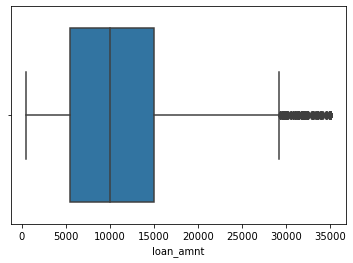

In [60]:
sns.boxplot(df["loan_amnt"])

We can see the "loan_amt" have many outlier. We take a look at some outliers

Upper outliers of dataset: 29250.0
Some rows of outliers

A look of boxplot after remove outliers


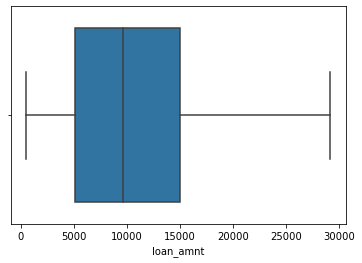

In [61]:
# outliers
df, outliers = eleminate_upper_ouliers(df, "loan_amnt")

In [62]:
# shape after remove outliers
df.shape

(38487, 19)

In [63]:
outliers.head(20)

,loan_amnt,funded_amnt,funded_amnt_inv,term,int_rate,installment,grade,sub_grade,emp_length,home_ownership,annual_inc,verification_status,issue_d,loan_status,purpose,addr_state,dti,inq_last_6mths,pub_rec_bankruptcies
31,31825,31825,31825.00000,36,7.90,995.82,A,A4,5 years,MORTGAGE,75000.0,Verified,Dec-11,Fully Paid,debt_consolidation,NJ,14.03,0,0.0
80,35000,22075,22050.00000,60,17.27,551.84,D,D3,3 years,MORTGAGE,150000.0,Verified,Dec-11,Fully Paid,home_improvement,NY,7.51,1,0.0
128,35000,35000,35000.00000,36,8.90,1111.37,A,A5,6 years,MORTGAGE,125000.0,Verified,Dec-11,Fully Paid,debt_consolidation,CA,22.71,0,0.0
185,35000,35000,35000.00000,36,10.65,1140.07,B,B2,2 years,MORTGAGE,168000.0,Verified,Dec-11,Fully Paid,debt_consolidation,TX,3.17,1,0.0
209,29500,29500,28513.45925,60,20.30,786.51,E,E5,6 years,MORTGAGE,83000.0,Source Verified,Dec-11,Fully Paid,debt_consolidation,NM,20.93,0,0.0
268,35000,26825,26800.00000,60,18.64,690.56,E,E1,8 years,MORTGAGE,85000.0,Verified,Dec-11,Fully Paid,debt_consolidation,IL,12.00,1,0.0
276,35000,35000,35000.00000,36,8.90,1111.37,A,A5,5 years,RENT,85000.0,Verified,Dec-11,Fully Paid,debt_consolidation,IL,17.73,0,0.0
300,30000,30000,28673.79652,60,12.42,673.72,B,B4,3 years,RENT,70000.0,Source Verified,Dec-11,Charged Off,small_business,TX,0.94,0,0.0
306,35000,23250,23200.00000,60,20.30,619.88,E,E5,5 years,RENT,85000.0,Verified,Dec-11,Fully Paid,debt_consolidation,NJ,20.16,0,0.0
336,35000,23150,21739.74813,60,17.27,578.71,D,D3,8 years,MORTGAGE,208000.0,Source Verified,Dec-11,Fully Paid,debt_consolidation,MD,7.94,0,0.0


In [64]:
outliers["purpose"].value_counts()

debt_consolidation    719
home_improvement      144
credit_card           123
small_business        110
other                  62
major_purchase         27
house                  22
wedding                10
medical                 5
moving                  4
car                     2
vacation                1
renewable_energy        1
Name: purpose, dtype: int64

##### Most of outliers purpose is "debt_consolidation"

#### funded_amnt

In [65]:
df["funded_amnt"].describe()

count    38487.000000
mean     10293.997973
std       6237.037245
min        500.000000
25%       5000.000000
50%       9250.000000
75%      14400.000000
max      29175.000000
Name: funded_amnt, dtype: float64

[]

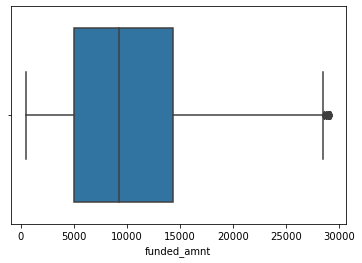

In [66]:
sns.boxplot(x =df["funded_amnt"])
plt.plot()

Upper outliers of dataset: 28500.0
Some rows of outliers

A look of boxplot after remove outliers


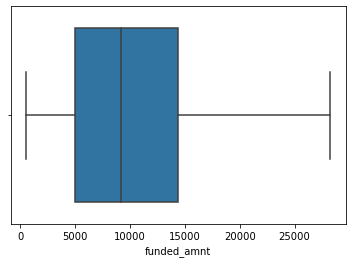

In [67]:
# outliers
df, outliers = eleminate_upper_ouliers(df, "funded_amnt")

In [68]:
# shape after remove outliers
df.shape

(38452, 19)

In [69]:
print(len(outliers))
outliers.head(20)

34


,loan_amnt,funded_amnt,funded_amnt_inv,term,int_rate,installment,grade,sub_grade,emp_length,home_ownership,annual_inc,verification_status,issue_d,loan_status,purpose,addr_state,dti,inq_last_6mths,pub_rec_bankruptcies
635,29000,29000,29000.00000,60,12.42,651.27,B,B4,10+ years,RENT,65000.0,Verified,Dec-11,Charged Off,debt_consolidation,PA,7.22,1,0.0
706,28625,28625,28600.00000,60,20.30,763.18,E,E5,6 years,OWN,55000.0,Verified,Dec-11,Fully Paid,debt_consolidation,NY,21.25,2,0.0
958,29000,29000,27884.92262,60,10.65,625.49,B,B2,10+ years,MORTGAGE,180000.0,Verified,Dec-11,Fully Paid,debt_consolidation,NH,3.90,0,0.0
1156,29100,29100,29100.00000,60,23.91,835.63,G,G4,< 1 year,RENT,95000.0,Source Verified,Dec-11,Fully Paid,debt_consolidation,NY,16.41,0,0.0
1814,29000,29000,29000.00000,60,12.69,655.25,B,B5,2 years,OWN,96000.0,Verified,Dec-11,Fully Paid,debt_consolidation,UT,12.88,0,0.0
1915,28625,28625,28625.00000,60,22.35,796.30,F,F5,10+ years,MORTGAGE,72000.0,Verified,Dec-11,Charged Off,debt_consolidation,PA,24.60,1,0.0
1943,29100,29100,28750.00000,60,10.65,627.64,B,B2,6 years,MORTGAGE,83496.0,Verified,Dec-11,Current,debt_consolidation,NY,14.00,0,0.0
2204,29000,29000,28975.00000,60,17.58,729.80,D,D4,10+ years,MORTGAGE,58000.0,Verified,Dec-11,Fully Paid,debt_consolidation,GA,8.88,3,0.0
2250,29100,29100,28825.00000,60,18.64,749.12,E,E1,2 years,MORTGAGE,152004.0,Verified,Dec-11,Fully Paid,major_purchase,CA,18.12,0,0.0
2506,29100,29100,28800.00000,60,20.30,775.84,E,E5,10+ years,RENT,72000.0,Verified,Dec-11,Charged Off,debt_consolidation,CA,20.23,0,0.0


#### funded_amnt_inv

In [70]:
df["funded_amnt_inv"].describe()

count    38452.000000
mean      9740.302171
std       6163.932906
min          0.000000
25%       5000.000000
50%       8491.023423
75%      13750.000000
max      28200.000000
Name: funded_amnt_inv, dtype: float64

[]

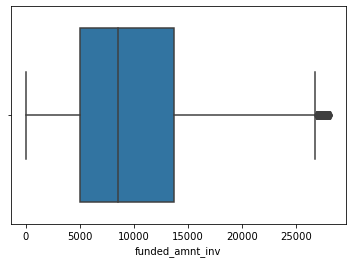

In [71]:
sns.boxplot(x =df["funded_amnt_inv"])
plt.plot()

Upper outliers of dataset: 26875.0
Some rows of outliers

A look of boxplot after remove outliers


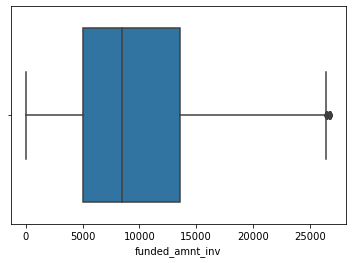

In [72]:
# outliers
df, outliers = eleminate_upper_ouliers(df, "funded_amnt_inv")

In [73]:
# shape after remove outliers
df.shape

(38282, 19)

In [74]:
print(len(outliers))
outliers.head(20)

170


,loan_amnt,funded_amnt,funded_amnt_inv,term,int_rate,installment,grade,sub_grade,emp_length,home_ownership,annual_inc,verification_status,issue_d,loan_status,purpose,addr_state,dti,inq_last_6mths,pub_rec_bankruptcies
193,28000,28000,27975.00000,60,17.58,704.64,D,D4,5 years,MORTGAGE,140000.0,Verified,Dec-11,Fully Paid,home_improvement,NC,12.07,1,0.0
309,28000,28000,28000.00000,36,12.69,939.26,B,B5,5 years,RENT,100000.0,Source Verified,Dec-11,Fully Paid,credit_card,WI,12.35,0,0.0
486,28000,28000,28000.00000,60,12.42,628.81,B,B4,4 years,MORTGAGE,85000.0,Source Verified,Dec-11,Fully Paid,debt_consolidation,PA,15.87,1,0.0
506,28000,28000,26968.31346,60,14.27,655.44,C,C2,7 years,MORTGAGE,95000.0,Verified,Dec-11,Fully Paid,debt_consolidation,WA,9.46,1,0.0
560,28000,28000,28000.00000,36,7.90,876.13,A,A4,4 years,MORTGAGE,118000.0,Verified,Dec-11,Charged Off,home_improvement,IL,5.29,1,0.0
628,27050,27050,27025.00000,60,18.64,696.35,E,E1,5 years,MORTGAGE,65000.0,Verified,Dec-11,Fully Paid,debt_consolidation,UT,19.75,0,0.0
632,27575,27575,27575.00000,36,10.65,898.21,B,B2,1 year,MORTGAGE,54000.0,Verified,Dec-11,Fully Paid,other,WY,12.27,1,0.0
705,27000,27000,27000.00000,36,9.91,870.08,B,B1,5 years,OWN,140000.0,Source Verified,Dec-11,Fully Paid,debt_consolidation,MA,7.44,0,0.0
717,28000,28000,28000.00000,36,15.96,983.85,C,C5,5 years,MORTGAGE,235000.0,Source Verified,Dec-11,Fully Paid,credit_card,VA,9.08,1,0.0
769,28000,28000,28000.00000,36,7.90,876.13,A,A4,4 years,RENT,65000.0,Verified,Dec-11,Fully Paid,credit_card,NJ,14.64,1,0.0


#### int_rate

In [75]:
df["int_rate"].describe()

count    38282.000000
mean        11.887946
std          3.640684
min          5.420000
25%          8.940000
50%         11.710000
75%         14.270000
max         24.590000
Name: int_rate, dtype: float64

[]

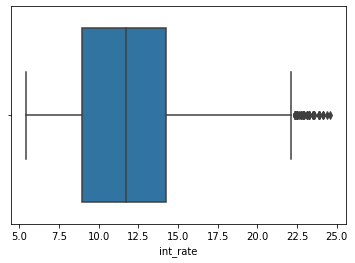

In [76]:
sns.boxplot(x =df["int_rate"])
plt.plot()

Upper outliers of dataset: 22.265
Some rows of outliers

A look of boxplot after remove outliers


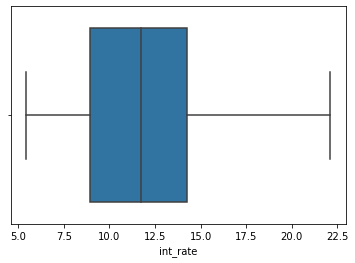

In [77]:
# outliers
df, outliers = eleminate_upper_ouliers(df, "int_rate")

In [78]:
# shape after remove outliers
df.shape

(38209, 19)

In [79]:
print(len(outliers))
outliers.head(20)

73


,loan_amnt,funded_amnt,funded_amnt_inv,term,int_rate,installment,grade,sub_grade,emp_length,home_ownership,annual_inc,verification_status,issue_d,loan_status,purpose,addr_state,dti,inq_last_6mths,pub_rec_bankruptcies
223,24250,18100,18075.00000,60,23.91,519.76,G,G4,7 years,MORTGAGE,120000.00,Verified,Dec-11,Fully Paid,debt_consolidation,AZ,12.96,3,0.0
540,13000,13000,13000.00000,60,23.52,370.38,G,G3,10+ years,RENT,61000.00,Source Verified,Dec-11,Current,debt_consolidation,NY,11.65,1,0.0
601,12375,12375,12375.00000,60,23.13,349.79,G,G2,5 years,RENT,40000.00,Not Verified,Dec-11,Charged Off,other,FL,20.88,0,0.0
616,22400,22400,22400.00000,60,22.74,628.13,G,G1,6 years,RENT,85000.00,Not Verified,Dec-11,Charged Off,credit_card,NY,7.02,1,0.0
733,24925,24925,24900.00000,60,23.91,715.75,G,G4,4 years,RENT,60000.00,Verified,Dec-11,Fully Paid,credit_card,FL,17.74,2,0.0
926,10400,10400,10400.00000,60,22.35,289.32,F,F5,3 years,MORTGAGE,72000.00,Source Verified,Dec-11,Charged Off,debt_consolidation,CA,8.82,0,0.0
964,8075,8075,8050.00000,60,22.35,224.64,F,F5,10+ years,MORTGAGE,35000.00,Verified,Dec-11,Fully Paid,debt_consolidation,PA,10.73,2,0.0
1199,18250,18250,18250.00000,60,23.52,519.95,G,G3,6 years,OWN,40000.00,Not Verified,Dec-11,Current,debt_consolidation,FL,19.20,0,0.0
1471,14650,14650,14650.00000,60,22.35,407.54,F,F5,10+ years,RENT,65000.00,Verified,Dec-11,Fully Paid,debt_consolidation,CA,22.58,1,0.0
1619,24250,24250,24225.00000,60,24.11,699.18,G,G5,1 year,MORTGAGE,108000.00,Verified,Dec-11,Fully Paid,credit_card,LA,12.27,2,0.0


#### installment

In [80]:
df["installment"].describe()

count    38209.000000
mean       305.013810
std        183.718068
min         15.690000
25%        163.710000
50%        271.450000
75%        404.270000
max        982.790000
Name: installment, dtype: float64

[]

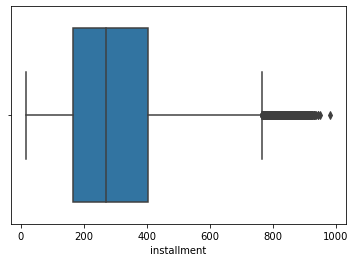

In [81]:
sns.boxplot(x =df["installment"])
plt.plot()

Upper outliers of dataset: 765.1099999999999
Some rows of outliers

A look of boxplot after remove outliers


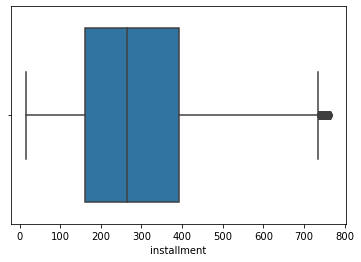

In [82]:
# outliers
df, outliers = eleminate_upper_ouliers(df, "installment")

In [83]:
# shape after remove outliers
df.shape

(37178, 19)

In [84]:
print(len(outliers))
outliers.head(20)

1031


,loan_amnt,funded_amnt,funded_amnt_inv,term,int_rate,installment,grade,sub_grade,emp_length,home_ownership,annual_inc,verification_status,issue_d,loan_status,purpose,addr_state,dti,inq_last_6mths,pub_rec_bankruptcies
51,25600,25600,25350.0,36,9.91,824.96,B,B1,9 years,RENT,110000.0,Verified,Dec-11,Fully Paid,credit_card,CA,15.71,0,0.0
106,24000,24000,24000.0,36,10.65,781.76,B,B2,10+ years,RENT,45000.0,Verified,Dec-11,Fully Paid,debt_consolidation,CA,14.80,0,0.0
131,24000,24000,24000.0,36,15.96,843.30,C,C5,8 years,MORTGAGE,90000.0,Source Verified,Dec-11,Charged Off,home_improvement,CA,9.17,1,0.0
170,25000,25000,25000.0,36,12.42,835.39,B,B4,2 years,RENT,225000.0,Verified,Dec-11,Fully Paid,debt_consolidation,NJ,8.32,0,0.0
190,24000,24000,24000.0,36,12.69,805.08,B,B5,10+ years,RENT,75000.0,Verified,Dec-11,Fully Paid,debt_consolidation,WA,11.60,0,0.0
196,25000,25000,25000.0,36,11.71,826.90,B,B3,10+ years,MORTGAGE,100000.0,Verified,Dec-11,Fully Paid,debt_consolidation,RI,6.88,1,0.0
293,25000,25000,25000.0,36,9.91,805.63,B,B1,9 years,RENT,61000.0,Source Verified,Dec-11,Fully Paid,debt_consolidation,CA,10.35,0,0.0
319,24000,24000,24000.0,36,16.29,847.21,D,D1,2 years,RENT,50964.0,Verified,Dec-11,Fully Paid,debt_consolidation,GA,8.83,1,0.0
343,22000,22000,21975.0,36,15.96,773.03,C,C5,5 years,MORTGAGE,73000.0,Verified,Dec-11,Fully Paid,debt_consolidation,IL,22.47,1,0.0
363,25000,25000,25000.0,36,15.27,869.95,C,C4,8 years,OWN,82000.0,Verified,Dec-11,Fully Paid,debt_consolidation,CA,18.50,2,0.0


####  emp_length

In [85]:
df["emp_length"].value_counts()

10+ years    9053
< 1 year     4390
2 years      4156
3 years      3890
4 years      3244
1 year       3084
5 years      3082
6 years      2087
7 years      1655
8 years      1358
9 years      1179
Name: emp_length, dtype: int64

#### home_ownership

In [86]:
df["home_ownership"].value_counts()

RENT        18113
MORTGAGE    16067
OWN          2901
OTHER          94
NONE            3
Name: home_ownership, dtype: int64

While "OTHER" and "NONE" is too few samples when compare with the others, so we need to remove it from data

In [87]:
df = df[~df["home_ownership"].isin(["OTHER", "NONE"])]

In [88]:
print(df.shape)
df["home_ownership"].value_counts()

(37081, 19)


RENT        18113
MORTGAGE    16067
OWN          2901
Name: home_ownership, dtype: int64

#### annual_inc

In [89]:
df["annual_inc"].describe()

count    3.708100e+04
mean     6.562290e+04
std      6.168185e+04
min      4.000000e+03
25%      4.000000e+04
50%      5.600000e+04
75%      7.900000e+04
max      6.000000e+06
Name: annual_inc, dtype: float64

Some will have very high income. Let see in boxplot

[]

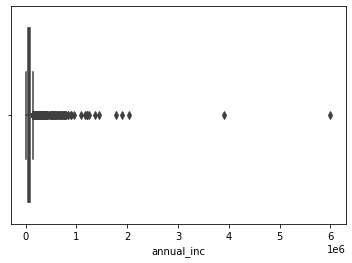

In [90]:
sns.boxplot(x =df["annual_inc"])
plt.plot()

Upper outliers of dataset: 137500.0
Some rows of outliers

A look of boxplot after remove outliers


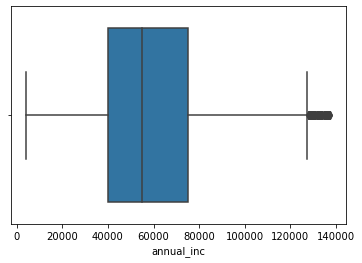

In [91]:
# outliers
df, outliers = eleminate_upper_ouliers(df, "annual_inc")

In [92]:
# shape after remove outliers
df.shape

(35459, 19)

In [93]:
print(len(outliers))
outliers.head(20)

1621


,loan_amnt,funded_amnt,funded_amnt_inv,term,int_rate,installment,grade,sub_grade,emp_length,home_ownership,annual_inc,verification_status,issue_d,loan_status,purpose,addr_state,dti,inq_last_6mths,pub_rec_bankruptcies
74,14400,14400,14400.00000,36,8.90,457.25,A,A5,< 1 year,OWN,150000.0,Source Verified,Dec-11,Fully Paid,debt_consolidation,NY,14.85,0,0.0
228,1500,1500,1500.00000,36,17.27,53.69,D,D3,10+ years,MORTGAGE,144000.0,Verified,Dec-11,Fully Paid,debt_consolidation,CA,8.23,0,0.0
298,8000,8000,8000.00000,36,11.71,264.61,B,B3,1 year,RENT,150000.0,Not Verified,Dec-11,Fully Paid,credit_card,NY,2.48,0,0.0
331,15000,15000,15000.00000,36,12.42,501.23,B,B4,6 years,OWN,155000.0,Verified,Dec-11,Fully Paid,debt_consolidation,GA,17.85,0,0.0
333,20000,13475,13041.47044,60,10.65,290.64,B,B2,2 years,MORTGAGE,175000.0,Verified,Dec-11,Current,debt_consolidation,TX,5.23,0,0.0
392,5000,5000,5000.00000,36,6.62,153.52,A,A2,1 year,RENT,276000.0,Source Verified,Dec-11,Fully Paid,debt_consolidation,FL,1.82,0,0.0
567,2000,2000,2000.00000,36,9.91,64.45,B,B1,1 year,MORTGAGE,231252.0,Source Verified,Dec-11,Fully Paid,other,GA,11.43,0,0.0
582,18000,18000,18000.00000,36,16.29,635.41,D,D1,10+ years,OWN,140000.0,Verified,Dec-11,Fully Paid,debt_consolidation,TX,21.80,1,0.0
603,9600,9600,9600.00000,36,14.27,329.37,C,C2,6 years,MORTGAGE,156000.0,Verified,Dec-11,Fully Paid,home_improvement,FL,15.54,3,0.0
689,21000,21000,21000.00000,36,7.90,657.10,A,A4,10+ years,MORTGAGE,150500.0,Verified,Dec-11,Fully Paid,debt_consolidation,NY,3.69,0,0.0


####  verification_status

In [94]:
df["verification_status"].value_counts()

Not Verified       16177
Verified           10137
Source Verified     9145
Name: verification_status, dtype: int64

####  dti

In [95]:
df["dti"].describe()

count    35459.000000
mean        13.464650
std          6.679882
min          0.000000
25%          8.350000
50%         13.570000
75%         18.760000
max         29.990000
Name: dti, dtype: float64

[]

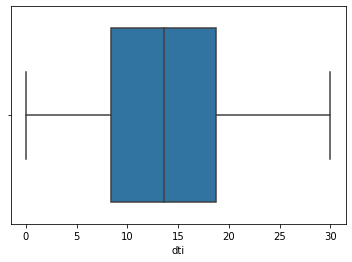

In [96]:
sns.boxplot(x =df["dti"])
plt.plot()

####  inq_last_6mths

In [97]:
df["inq_last_6mths"].value_counts()/len(df)*100

0    48.752080
1    27.702417
2    14.577399
3     7.600327
4     0.767083
5     0.352520
6     0.132547
7     0.084605
8     0.031022
Name: inq_last_6mths, dtype: float64

[]

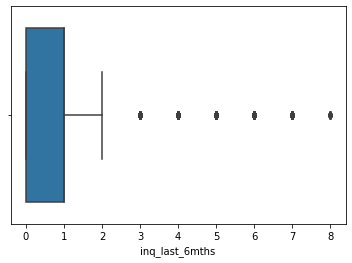

In [98]:
sns.boxplot(x =df["inq_last_6mths"])
plt.plot()

In [99]:
# we will remove which sample have "inq_last_6mths" counts < 5% (only keep 0, 1, 2)
df = df[df["inq_last_6mths"].isin([0, 1, 2])]

In [100]:
df["inq_last_6mths"].value_counts()

0    17287
1     9823
2     5169
Name: inq_last_6mths, dtype: int64

#### pub_rec_bankruptcies

In [101]:
df["pub_rec_bankruptcies"].value_counts()

0.0    30863
1.0     1410
2.0        6
Name: pub_rec_bankruptcies, dtype: int64

In [102]:
# we will remove which sample have "pub_rec_bankruptcies" = 2.0 (too few sample)
df = df[df["pub_rec_bankruptcies"] != 2.0]

# Target: Adding columns "defaults" driven from "loan status"


In [103]:
df["loan_status"].value_counts()

Fully Paid     27062
Charged Off     4361
Current          850
Name: loan_status, dtype: int64

Our target is determine the affect of others attibute to fefaults. The "Current" seem not sure to become default or non-default, and it have lowest sample, so we will remove it

In [104]:
df = df[df["loan_status"] != "Current"]

In [105]:
# columns defaults driven from "loan_status"
df["default_status"] =  df["loan_status"].apply(lambda x: 1 if x == 'Charged Off' else 0)

In [106]:
# drop the loan status
df = df.drop(["loan_status"], axis=1)

# Correlation between attributes

In [107]:
corr_matrix = df.corr()

<AxesSubplot:>

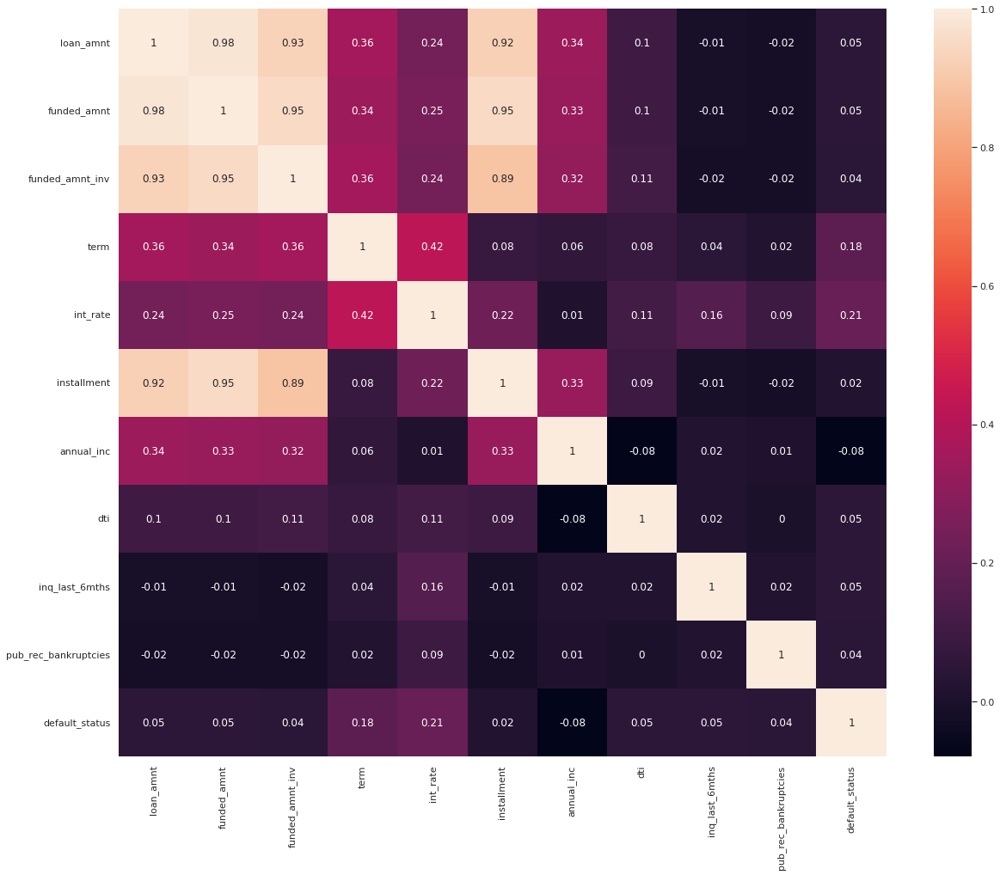

In [108]:
sns.set(rc={'figure.figsize':(20,16)})
sns.heatmap(round(df.corr(), 2), annot=True)

In [109]:
# finding high coorelation attributes
upper_matrix = corr_matrix.where(np.triu(np.ones(corr_matrix.shape),k=1).astype(bool))
to_drop = [column for column in upper_matrix.columns if any(np.abs(upper_matrix[column]) > 0.95)]
print("Drop columns:", to_drop)
df = df.drop(to_drop, axis=1)

Drop columns: ['funded_amnt', 'funded_amnt_inv', 'installment']


In [110]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 31423 entries, 0 to 39716
Data columns (total 16 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   loan_amnt             31423 non-null  int64  
 1   term                  31423 non-null  int64  
 2   int_rate              31423 non-null  float64
 3   grade                 31423 non-null  object 
 4   sub_grade             31423 non-null  object 
 5   emp_length            31423 non-null  object 
 6   home_ownership        31423 non-null  object 
 7   annual_inc            31423 non-null  float64
 8   verification_status   31423 non-null  object 
 9   issue_d               31423 non-null  object 
 10  purpose               31423 non-null  object 
 11  addr_state            31423 non-null  object 
 12  dti                   31423 non-null  float64
 13  inq_last_6mths        31423 non-null  int64  
 14  pub_rec_bankruptcies  31423 non-null  float64
 15  default_status     

# Univariate analysis

In [111]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 31423 entries, 0 to 39716
Data columns (total 16 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   loan_amnt             31423 non-null  int64  
 1   term                  31423 non-null  int64  
 2   int_rate              31423 non-null  float64
 3   grade                 31423 non-null  object 
 4   sub_grade             31423 non-null  object 
 5   emp_length            31423 non-null  object 
 6   home_ownership        31423 non-null  object 
 7   annual_inc            31423 non-null  float64
 8   verification_status   31423 non-null  object 
 9   issue_d               31423 non-null  object 
 10  purpose               31423 non-null  object 
 11  addr_state            31423 non-null  object 
 12  dti                   31423 non-null  float64
 13  inq_last_6mths        31423 non-null  int64  
 14  pub_rec_bankruptcies  31423 non-null  float64
 15  default_status     

## loan_amnt

#### Univariate

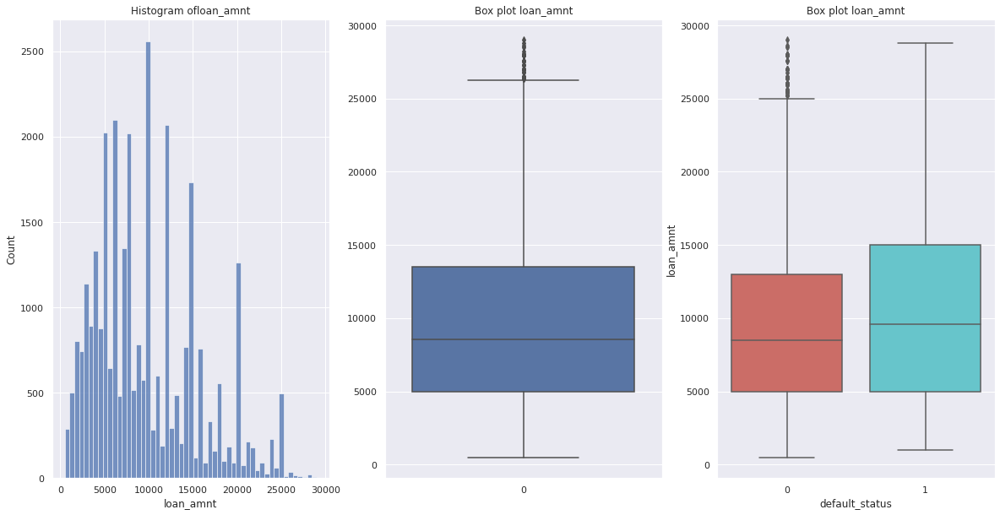

In [112]:
plot_uni_numb(data = df, column = "loan_amnt")

#### Driven
Devide loan_amnt into groups:
<br>0: 0 to 5k
<br>1: 5K to 10k
<br>2: 10k to 15k
<br>3: 15k to 20k
<br>4: 20k to 25k
<br>5: 25k to 30k
<br>6: over 30k

In [113]:
df["loan_amnt_group"] = df["loan_amnt"].apply(lambda x: int(x/5000) if x <30000 else 6)

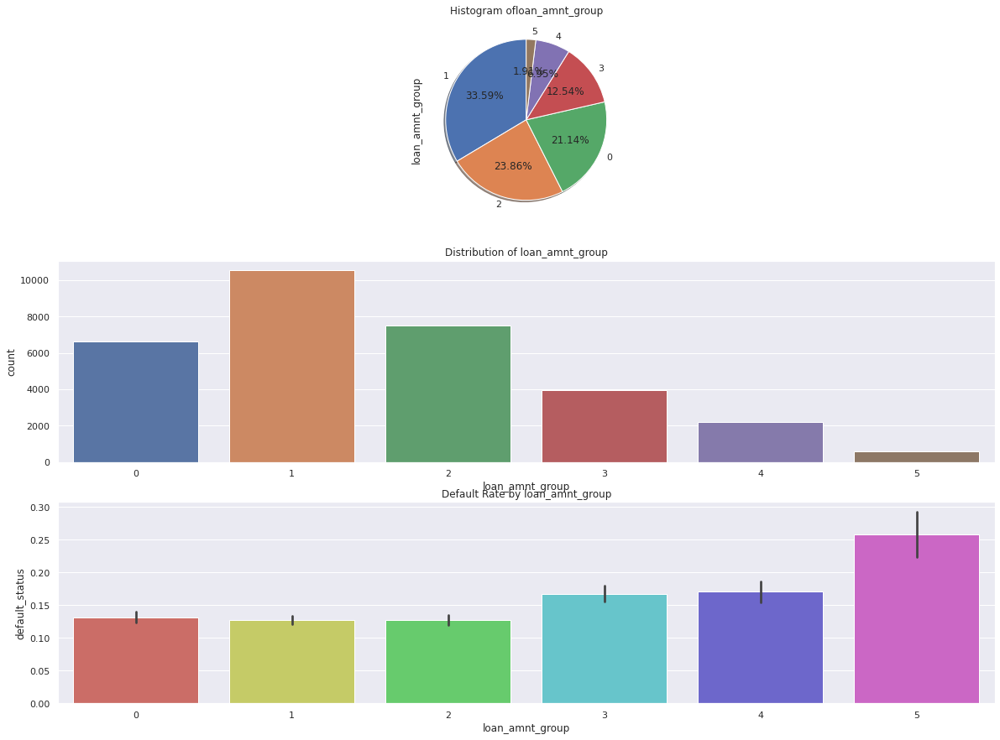

In [114]:
plot_bi_cate(df,"loan_amnt_group")

#### Finding
The loan amount mostly in range 5k to 10k
The amount of loan affect the default rate, higher loan_mount can get higher rate of default

## term

#### Univariate

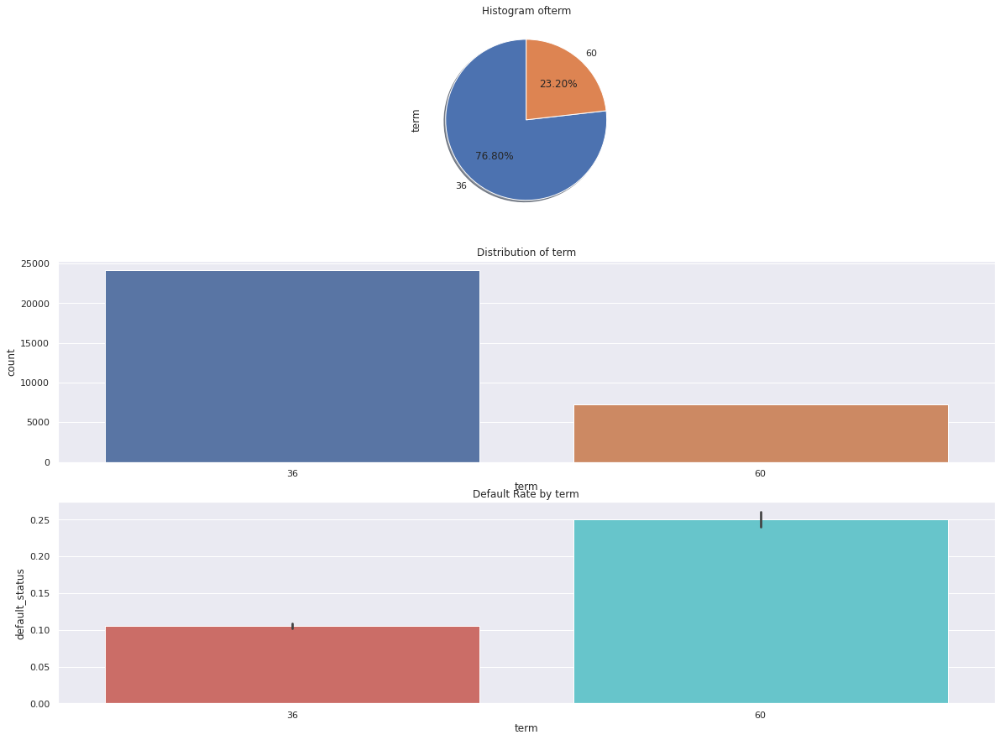

In [115]:
plot_bi_cate(df,"term")

#### Finding
The term mostly in option 36 months. The 60 months term can get higher rate of default

## int_rate

In [116]:
df["int_rate"]

0        10.65
2        15.96
3        13.49
6        15.96
7        18.64
8        21.28
9        12.69
10       14.65
11       12.69
12       13.49
13        9.91
14       10.65
15       16.29
16       15.27
17        6.03
18       11.71
19        6.03
21       12.42
22       11.71
23       11.71
24       11.71
25        9.91
26       14.27
27       16.77
28       11.71
29       11.71
30        7.51
33        8.90
34       15.96
35       10.65
36        9.91
37        7.90
38       12.42
40        7.51
41        7.90
42       18.25
43       16.77
44        6.03
45        9.91
46        8.90
47       10.65
48        6.03
49        6.62
50        9.91
52       10.65
53       15.96
54        9.91
55       19.91
57       12.42
59       16.77
60       12.69
61       17.27
62       14.65
64       10.65
65       10.65
66       17.27
67       14.27
69       14.65
70       17.58
71       16.77
72       13.49
73       16.77
75       14.65
77       21.67
78        7.90
79       19.91
81       1

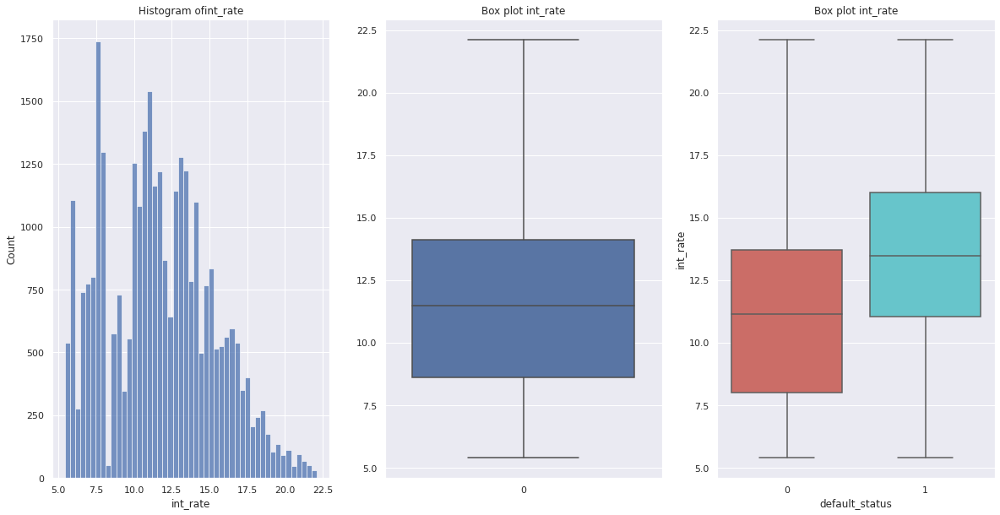

In [117]:
plot_uni_numb(data = df, column = "int_rate")

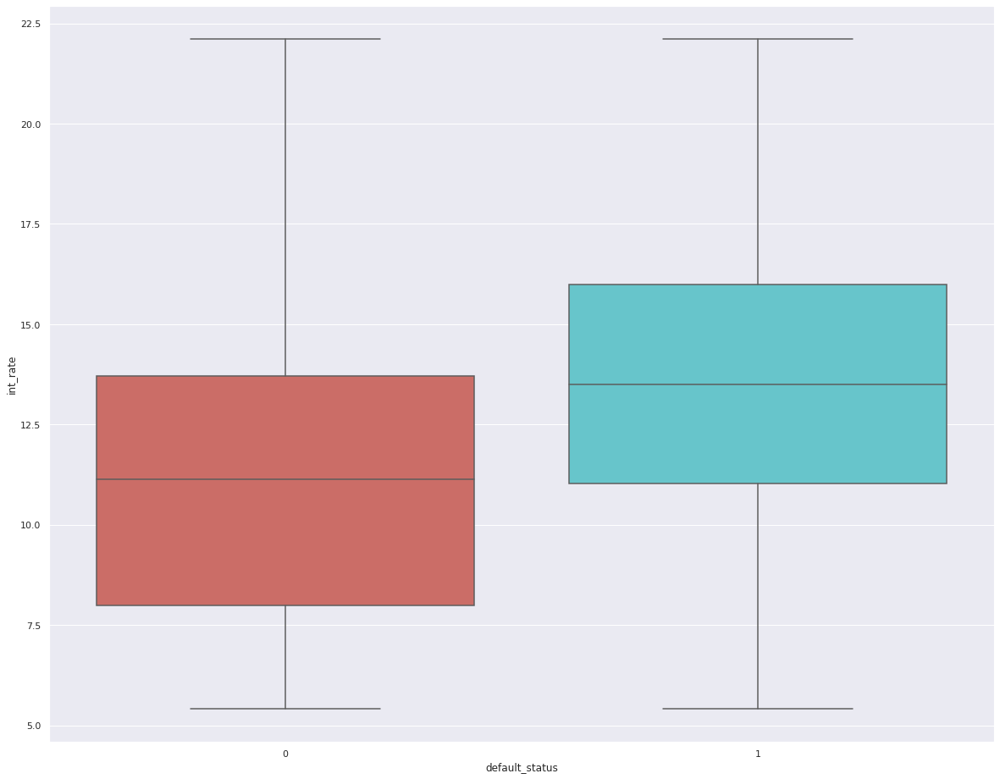

In [118]:
sns.boxplot(y = df["int_rate"],x = df['default_status'],palette='hls')
plt.show()

#### Finding
The invest rate have a gap in 8.5%. Below 8.5% mostly the mortgage loan, and above is unsercured loan. We will take a look at it

#### Derive

In [119]:
df["loan_type"] = df["int_rate"].apply(lambda x: "mortgage" if x< 8.5 else "unsecured")

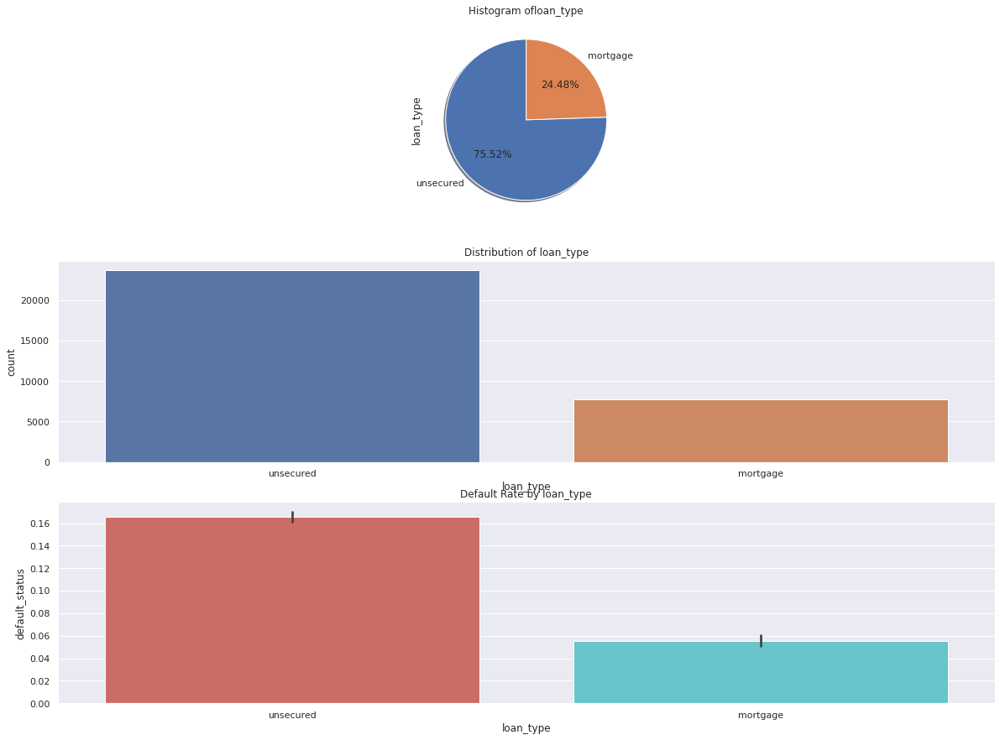

In [120]:
plot_bi_cate(df,"loan_type")

#### Finding
If the loan type is mortage, the average default rate is less than 3 times

## grade

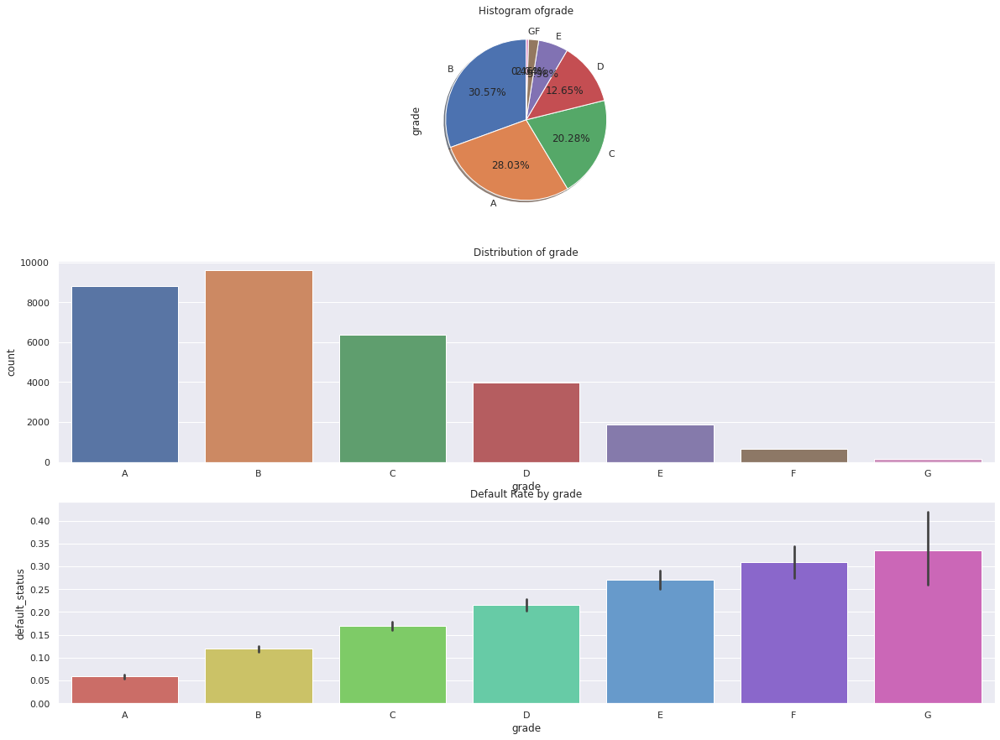

In [121]:
plot_bi_cate(data = df, column="grade", check_order=True)

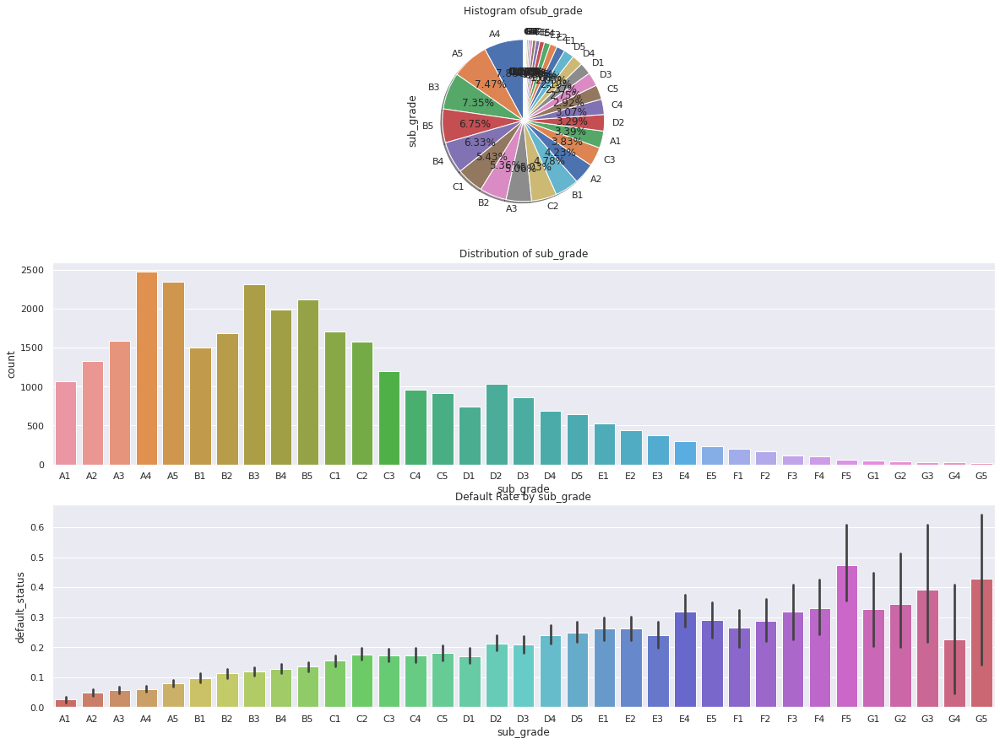

In [122]:
plot_bi_cate(data = df, column="sub_grade", check_order=True)

#### Finding
The grade work well. Most of contract getting G grade. Higher rate could get lower rate of default

## emp_length

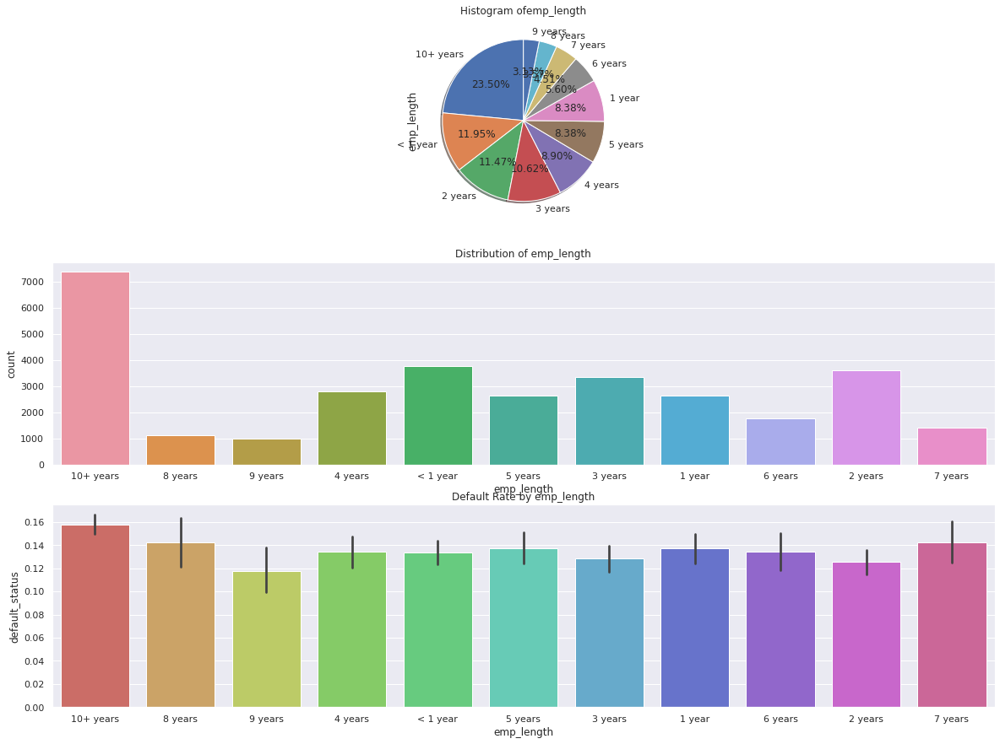

In [123]:
plot_bi_cate(data = df, column = "emp_length")

## Finding:

'10+ years mean the avearge ages will be over 30.
They has good volume as well has higher default rate

## home_ownership

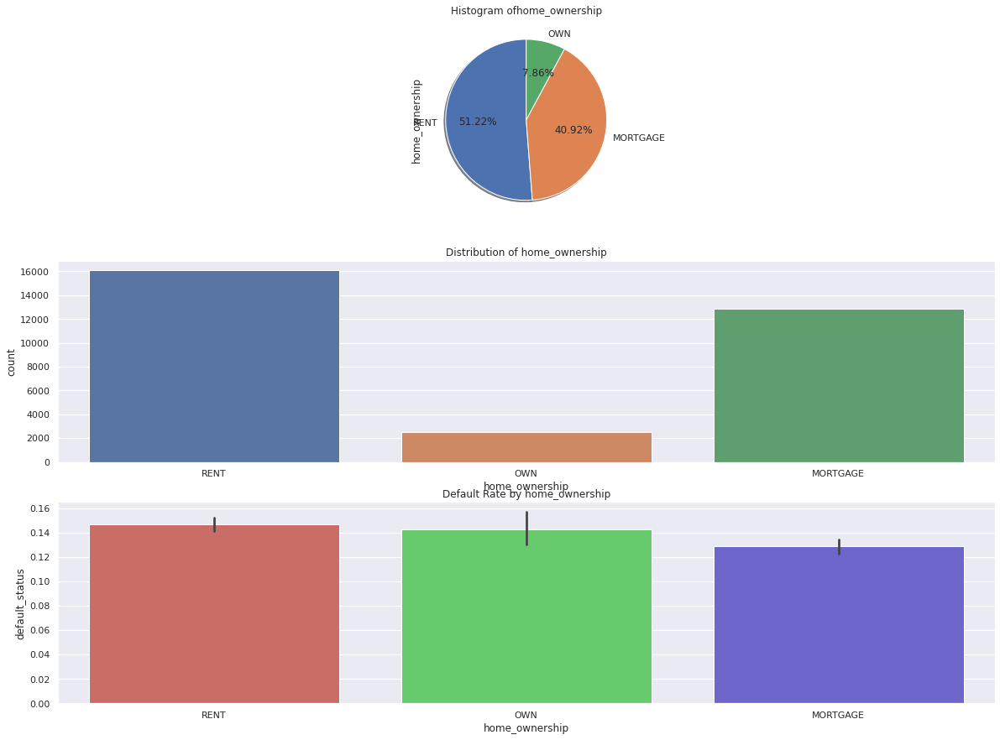

In [124]:
plot_bi_cate(data = df, column = "home_ownership")

In [125]:
pd.pivot_table(data = df, columns = "loan_type", index = ["home_ownership"], values = "default_status", aggfunc=np.sum)

loan_type,mortgage,unsecured
home_ownership,,
MORTGAGE,187,1466
OWN,42,310
RENT,199,2157


In [126]:
pd.pivot_table(data = df, columns = "loan_type", index = ["home_ownership"], values = "default_status", aggfunc=np.mean)

loan_type,mortgage,unsecured
home_ownership,,
MORTGAGE,0.048571,0.162762
OWN,0.061493,0.173378
RENT,0.063015,0.166731


#### Fiding
<br> People who alredy own home take less loan.
<br> The home ownership not affect much feault or not. 
<br> 'Rent' and 'Own' have similar default rate
<br> 'Mortgage' group has slightly lower default rate

## annual_inc

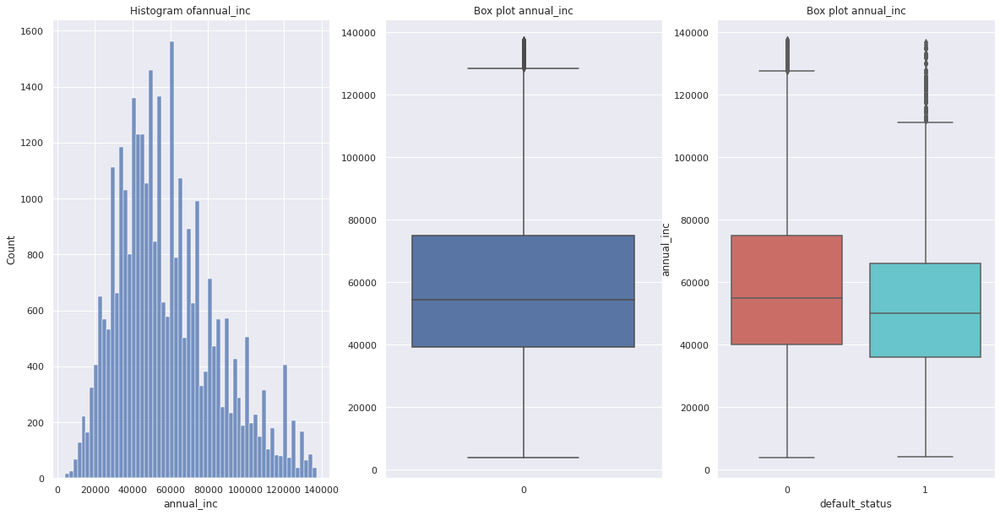

In [127]:
plot_uni_numb(data = df, column = "annual_inc")

#### Derive

In [128]:
income_type = ["low", "low average", "high average", "high"]
df["annual_inc_group"] = df["annual_inc"].apply(lambda x: income_type[int(x/30000)] if x < 120000 else 4)

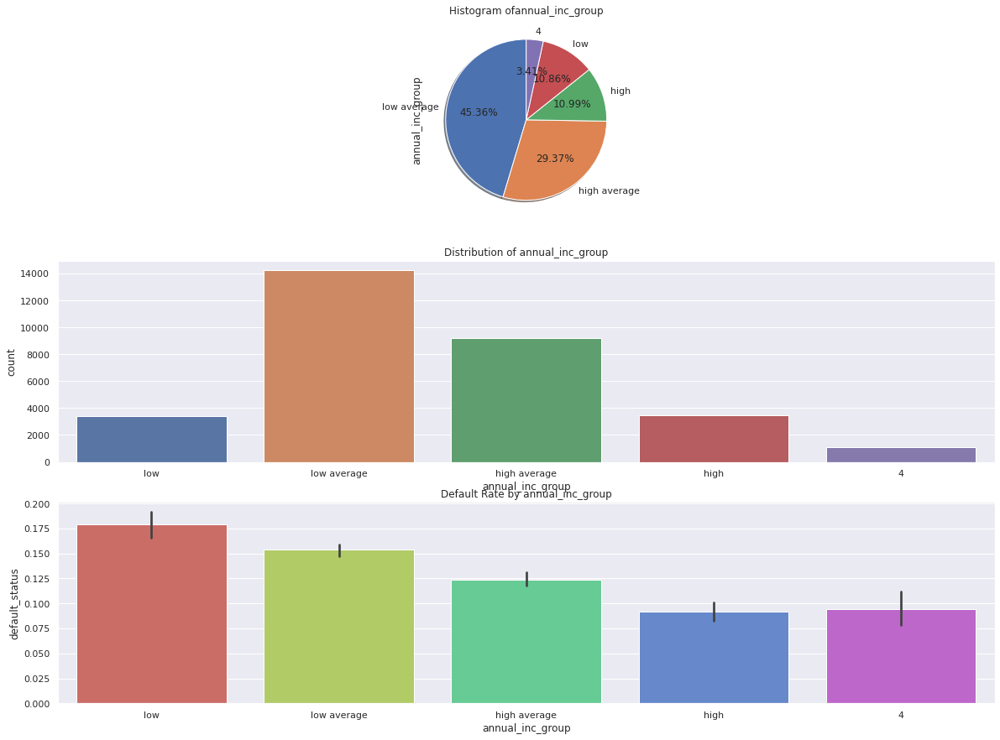

In [129]:
plot_bi_cate(data=df, column="annual_inc_group")

#### Finding
<br> Lower incomes have higher default rate
<br> Most of the loan come from people have low average income(30k-60k)

## verification_status

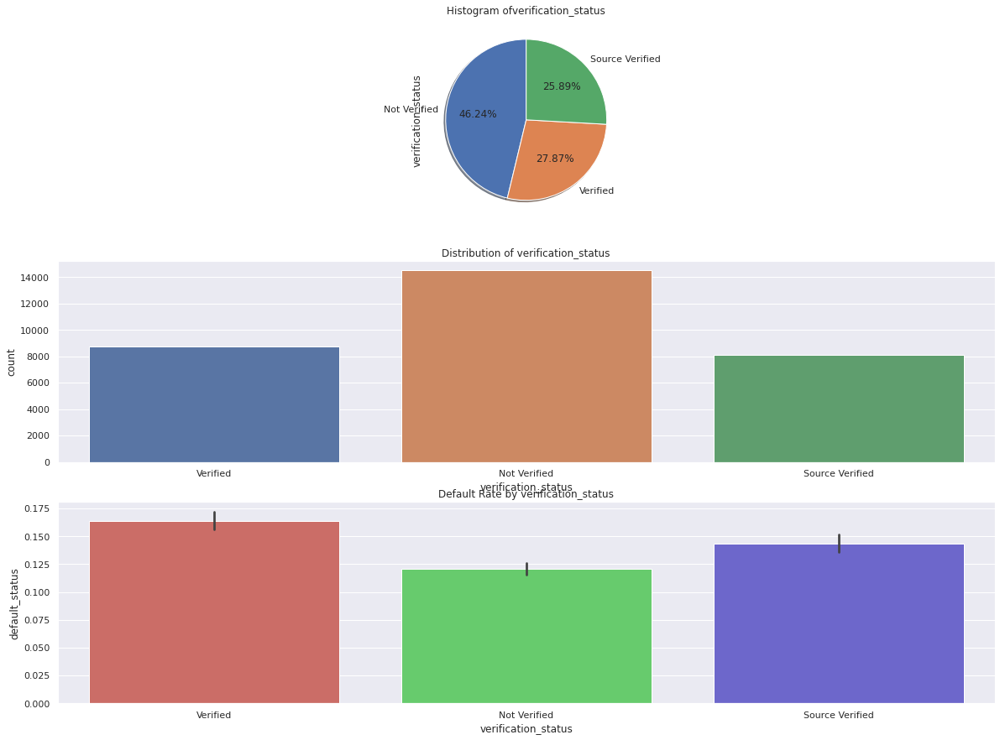

In [130]:

plot_bi_cate(data = df, column="verification_status")

#### Finding
Strange finding: 'Not verified' has lower default rate than 'Verified', despite it have highest amount of sample.

## issue_d

In [131]:
df['issue_m']=df['issue_d'].apply(lambda x: x.split("-")[0])
df['issue_y']=df['issue_d'].apply(lambda x: 2000+int(x[-2:]))

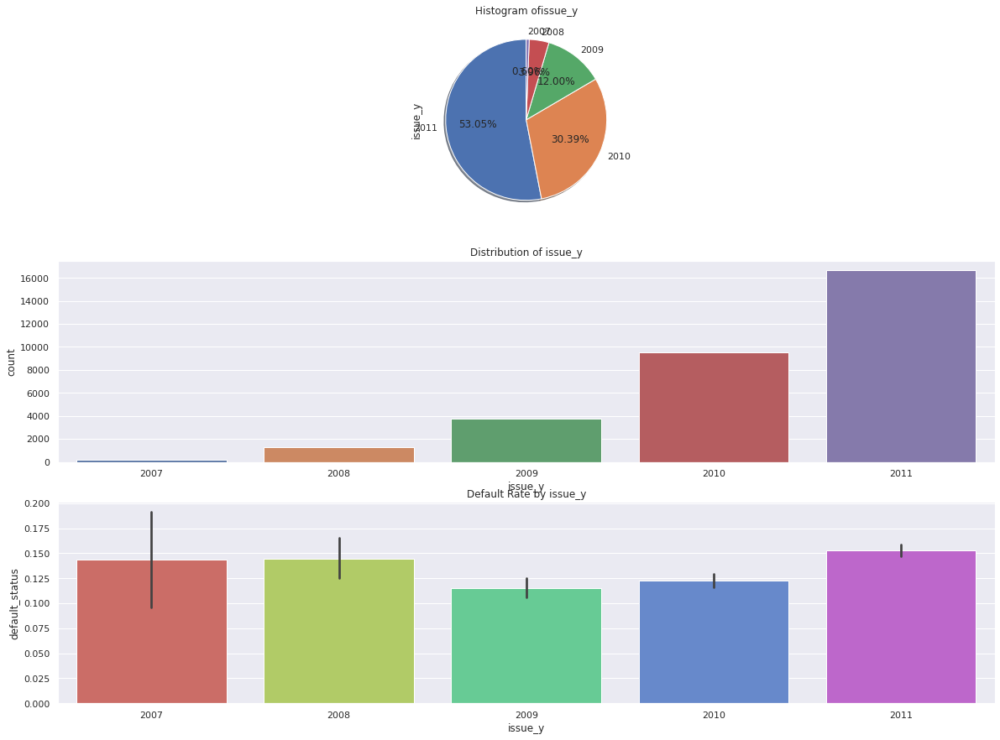

In [132]:
plot_bi_cate(data = df, column="issue_y")

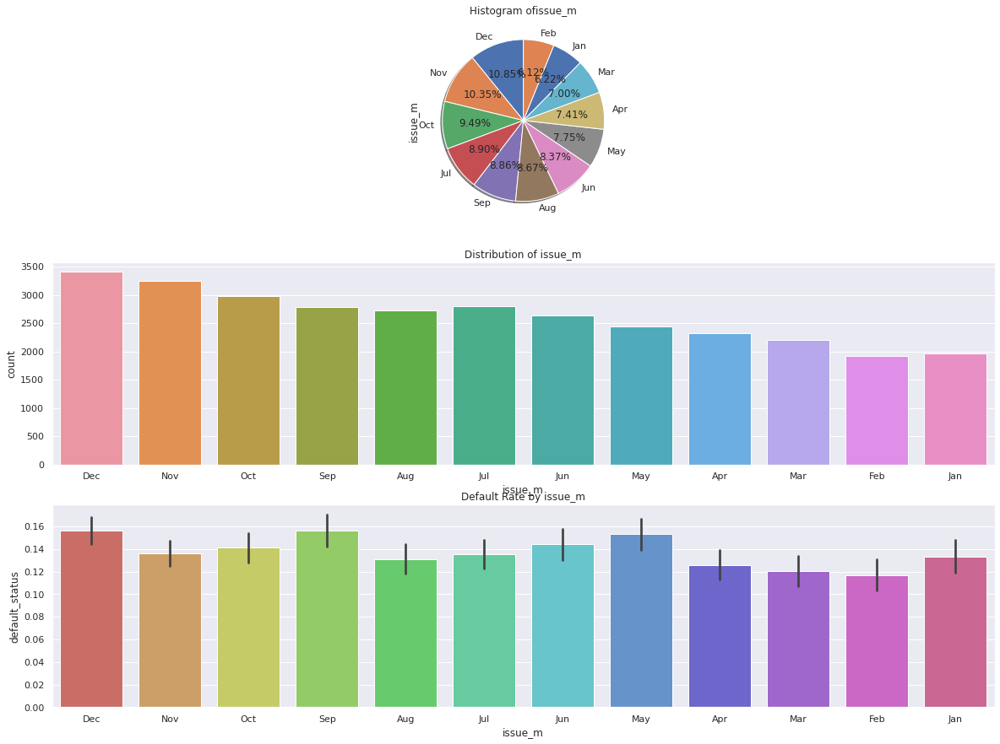

In [133]:
plot_bi_cate(data = df, column="issue_m")

#### Finding
<br>The number of loans issued go up from 2007 to 2011 and the default rate went down during these year until 2011, where we see spike in default rate.
<br>2010 has lower default rate
<br>People more likely to have loan in end years

## purpose

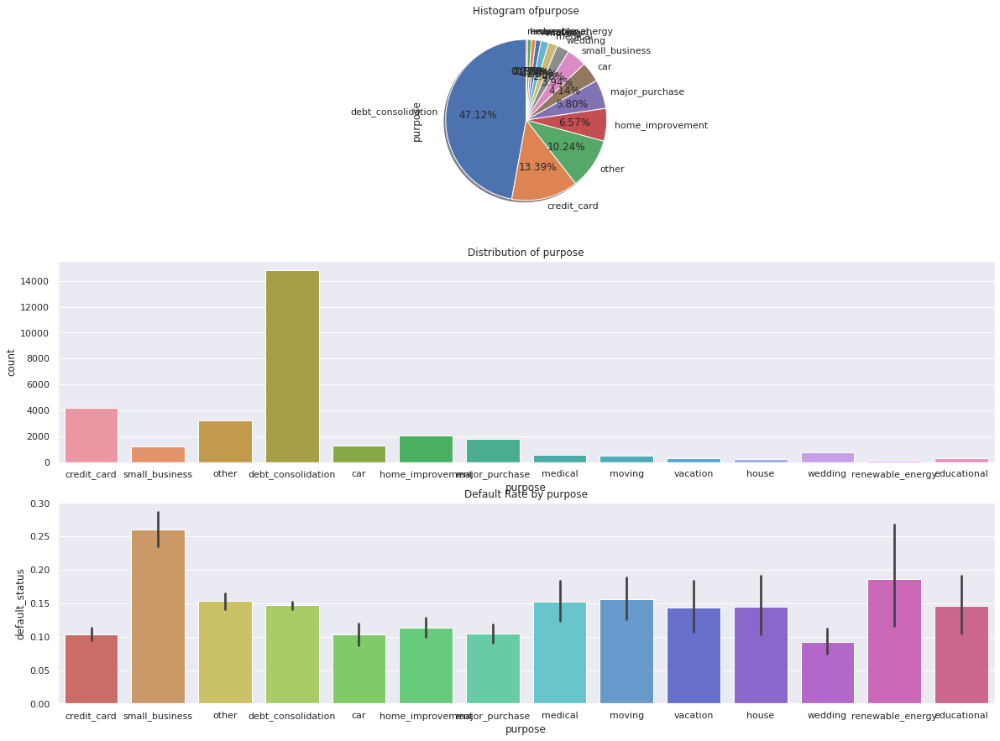

In [134]:
plot_bi_cate(data = df, column= "purpose")

<AxesSubplot:ylabel='int_rate'>

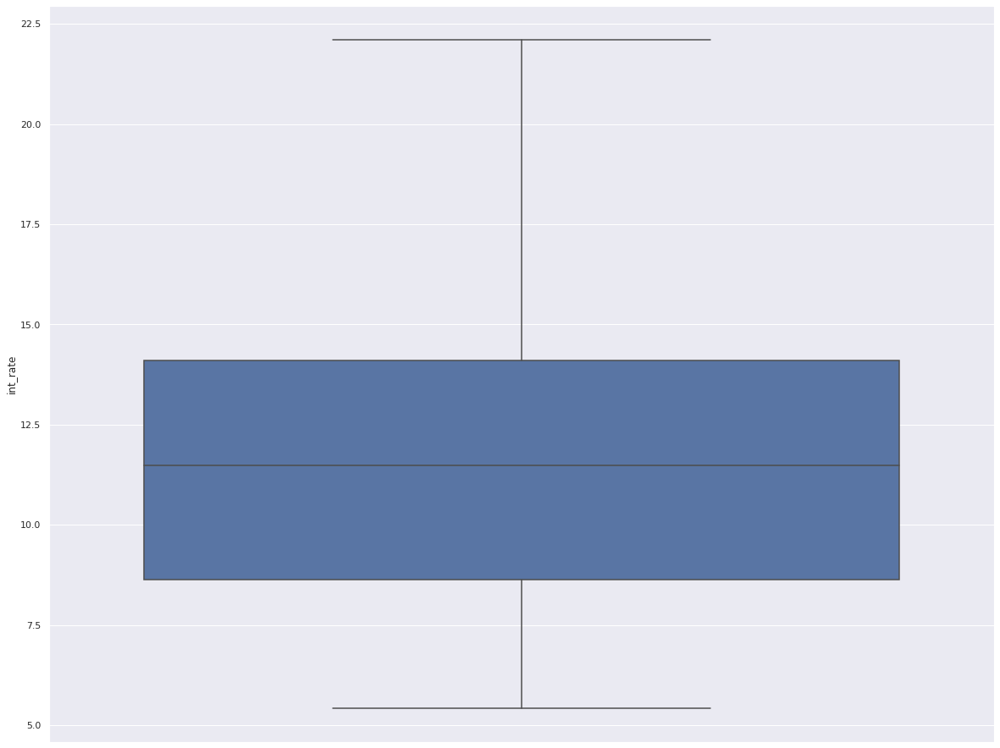

In [135]:
# plot_uni_numb(df, column="int_rate") 
sns.boxplot(y = df["int_rate"])

<AxesSubplot:ylabel='int_rate'>

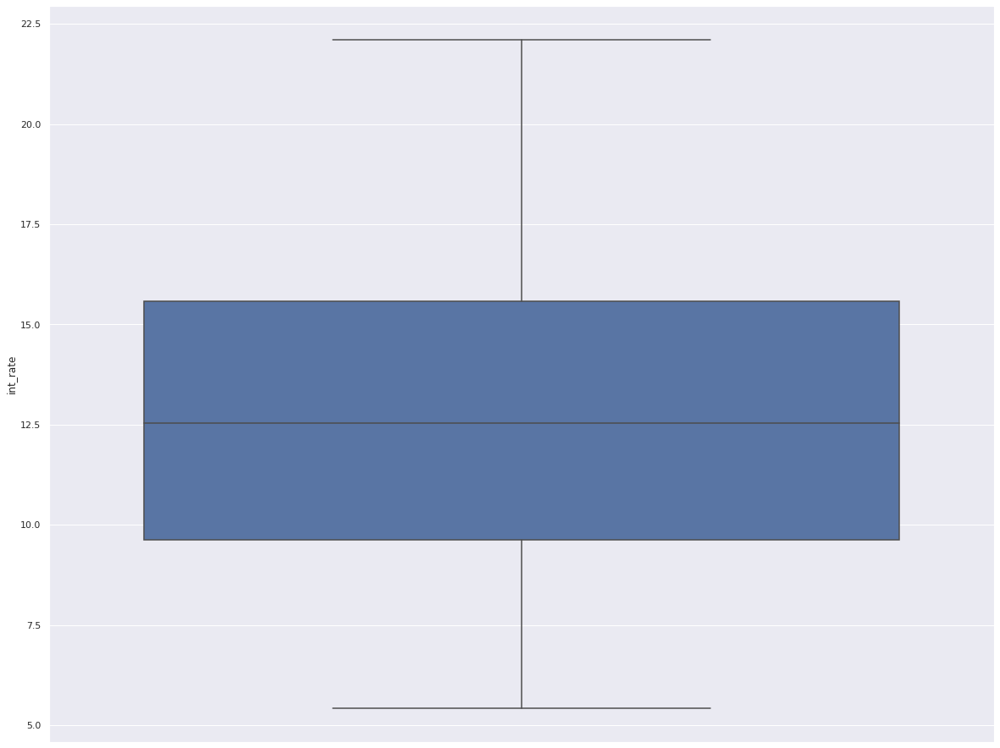

In [136]:
sns.boxplot(y = df[df["purpose"] == "small_business"]["int_rate"])
# plot_uni_numb(, column="int_rate") 

#### Finding:

<br> debt_consolidation has the largest count on aprroved loan.
<br> small_business loans have the highest default rates. High risk, high interest?
<br> major_purchase has the lowest default rate.

#### addr_state

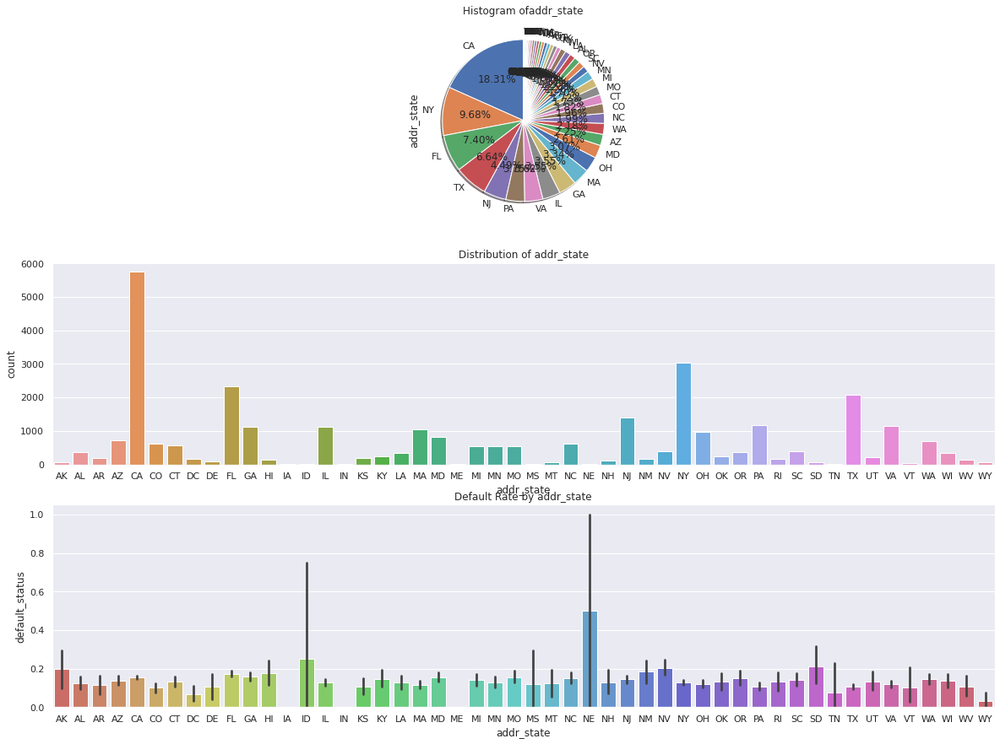

In [137]:
plot_bi_cate(data = df, column = "addr_state", check_order=True)

#### Fiding
<br> CA have highest loan amount, but very low default rate. In other side, NE, SD have very few loan amount, but the default rate is very high.

## dti

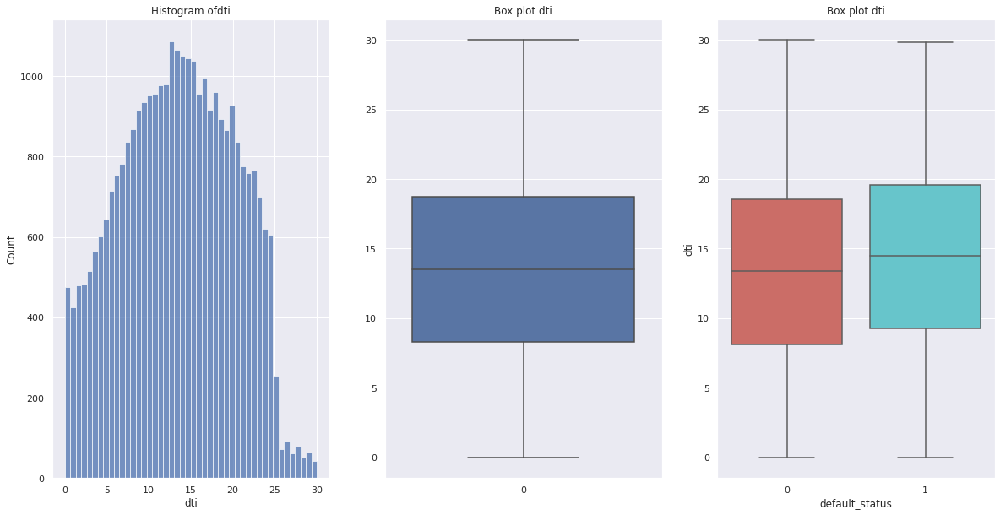

In [138]:
plot_uni_numb(data = df, column = "dti")

#### driven

In [139]:
df["dti_group"] = df["dti"].apply(lambda x: int(x/5) if x < 30 else 6)

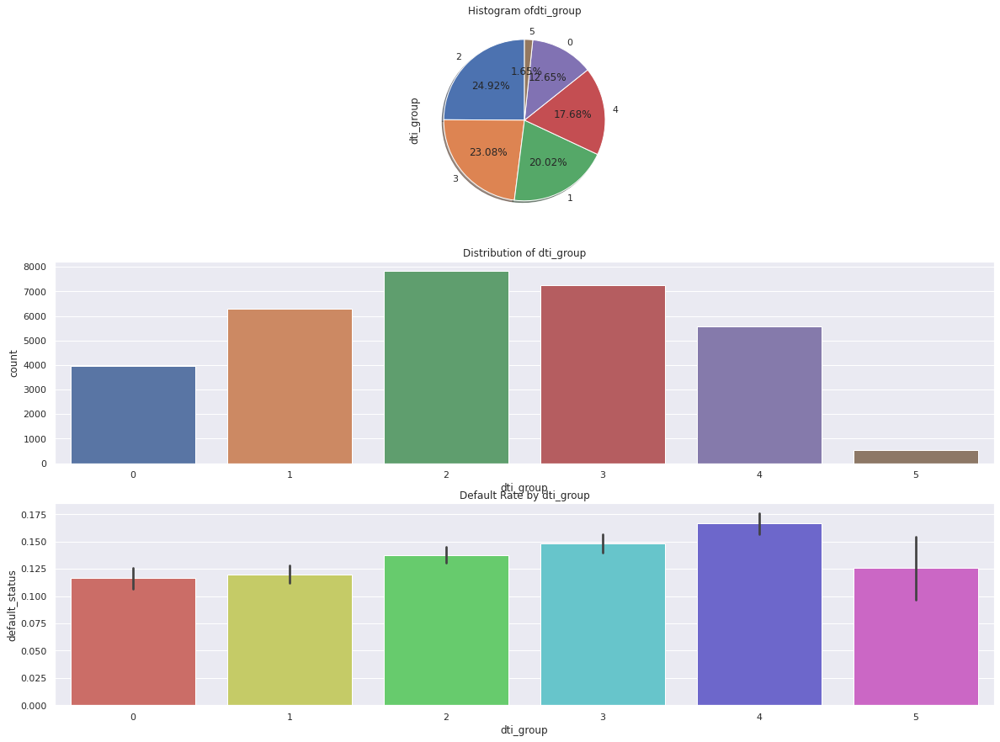

In [140]:
plot_bi_cate(data = df, column = "dti_group")

#### Finding
<br>Most people have their loan amount from 5-20 percent DTI 
<br>Higher the DTI, higher the default rate
<br>It's risky to offer loan to cutomers with high DTI.

## inq_last_6mths

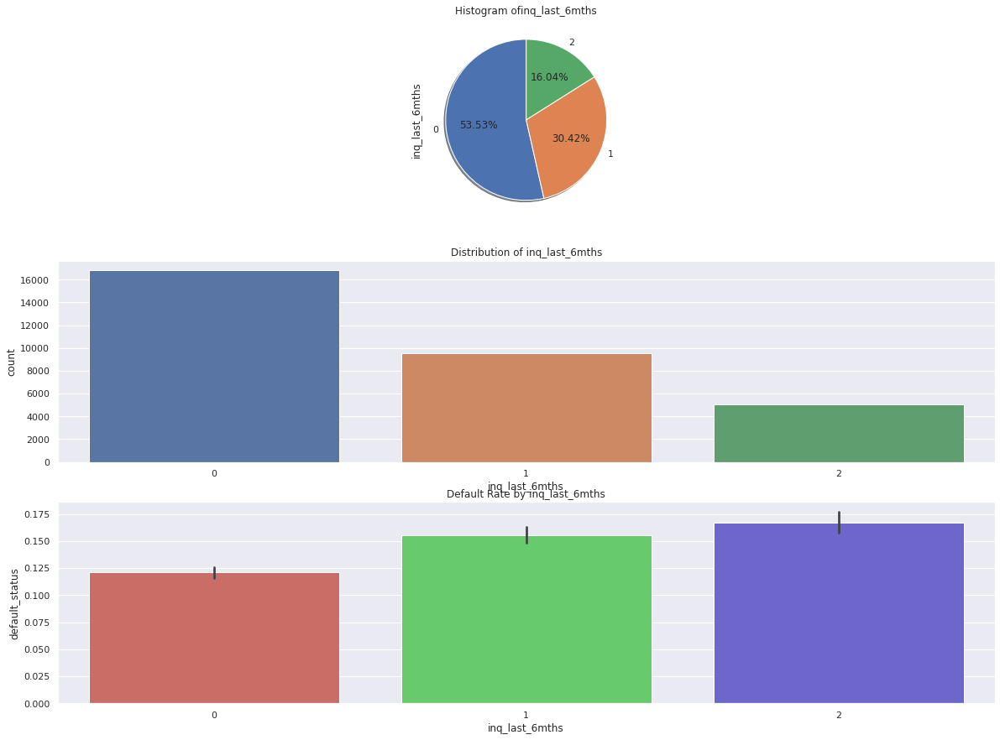

In [141]:
plot_bi_cate(data = df, column = "inq_last_6mths")

#### Finding
The people get loan mostly have no inquiry in 6 month, and they have lowest rate of default.

## pub_rec_bankruptcies

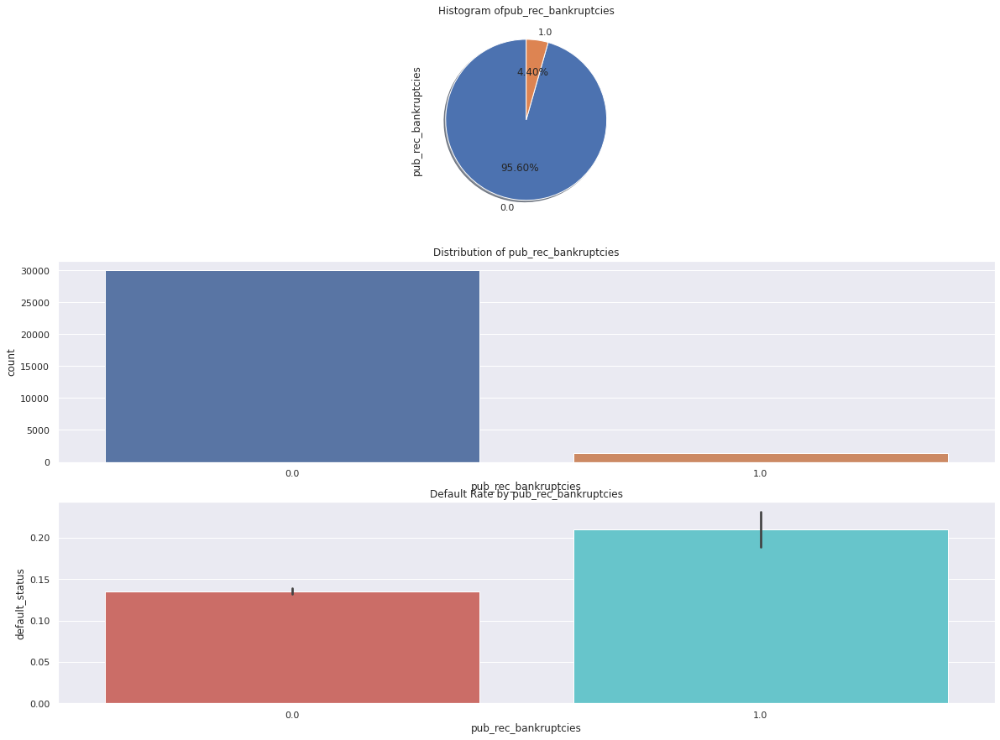

In [142]:
plot_bi_cate(data = df, column = "pub_rec_bankruptcies")

#### Finding
Higher the bankruptcies, the higher is the default rate